## CLASSIFICATION OF MUSIC GENRE

**Step 1: Import Necessary Libraries**

In [1]:
# Libraries for Audio Preprocessing
import os
import librosa
import librosa.display
import numpy as np

# Libraries for Data Handling and Manipulation
import pandas as pd
from collections import Counter
from sklearn.utils import shuffle

# Libraries for Visualization
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import seaborn as sns
from IPython.display import Audio
from joypy import joyplot
import plotly.express as px

# Libraries for Machine Learning Preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, label_binarize

# Libraries for Machine Learning Classifiers
from sklearn.svm import SVC
from sklearn.ensemble import (
    RandomForestClassifier, 
    VotingClassifier, 
    HistGradientBoostingClassifier
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# Libraries for Model Evaluation and Metrics
from sklearn.metrics import (
    accuracy_score, 
    f1_score, 
    precision_score, 
    recall_score, 
    classification_report, 
    confusion_matrix, 
    roc_curve, 
    roc_auc_score,
    auc
)
from sklearn.inspection import permutation_importance

# Libraries for Hyperparameter Tuning
from sklearn.multiclass import OneVsRestClassifier

# Utility Libraries for Saving Models and Progress Tracking
import joblib
from itertools import cycle
import random
from anytree import Node, RenderTree
from anytree.exporter import DotExporter
import tqdm

# Additional Libraries
import math

## Data Collection And Preparation

**Step 2.1: Load Dataset and Prepare File Paths**

In [2]:
# Specify the dataset path
base_path = "./genres_original"

# Initialize lists to store file paths and genre labels
file_paths = []
genres = []

# Traverse the dataset directory
for genre in os.listdir(base_path):
    genre_path = os.path.join(base_path, genre)
    if os.path.isdir(genre_path):
        for file_name in os.listdir(genre_path):
            file_paths.append(os.path.join(genre_path, file_name))
            genres.append(genre)

# Create a DataFrame to store paths and labels
dataset_df = pd.DataFrame({'file_path': file_paths, 'genre': genres})
print(f"Dataset contains {len(dataset_df)} audio files.")


Dataset contains 1000 audio files.


In [3]:
# Display dataset overview
print("\nDataset Head:")
print(dataset_df.head())

print("\nDataset Tail:")
print(dataset_df.tail())


Dataset Head:
                                 file_path  genre
0  ./genres_original\blues\blues.00000.wav  blues
1  ./genres_original\blues\blues.00001.wav  blues
2  ./genres_original\blues\blues.00002.wav  blues
3  ./genres_original\blues\blues.00003.wav  blues
4  ./genres_original\blues\blues.00004.wav  blues

Dataset Tail:
                                 file_path genre
995  ./genres_original\rock\rock.00095.wav  rock
996  ./genres_original\rock\rock.00096.wav  rock
997  ./genres_original\rock\rock.00097.wav  rock
998  ./genres_original\rock\rock.00098.wav  rock
999  ./genres_original\rock\rock.00099.wav  rock


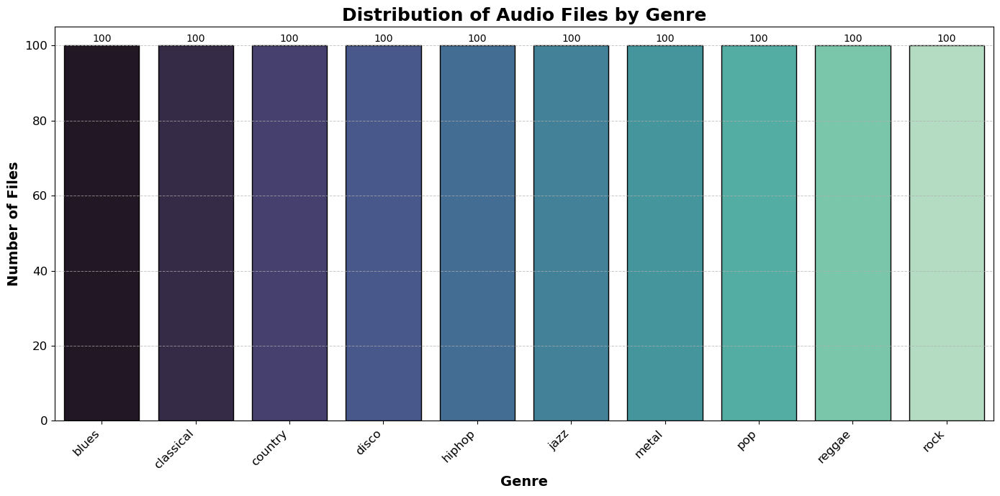

In [4]:
# Analyze class distribution
genre_distribution = dataset_df['genre'].value_counts()
# plt.style.use('ggplot')
# Create the plot
plt.figure(figsize=(14, 7))
sns.barplot(
    x=genre_distribution.index,
    y=genre_distribution.values,
    palette="mako",  # distinctive and vibrant palette
    edgecolor="black")  # an edge to the bars

# Add titles and labels
plt.title("Distribution of Audio Files by Genre", fontsize=18, fontweight="bold", color="black", loc="center")
plt.xlabel("Genre", fontsize=14, fontweight="bold", color="black")
plt.ylabel("Number of Files", fontsize=14, fontweight="bold", color="black")
plt.xticks(rotation=45, fontsize=12, ha='right', color="black")
plt.yticks(fontsize=12, color="black")

# Set the background color for the figure and axes
plt.gcf().set_facecolor('white')  # figure
plt.gca().set_facecolor('white')  # axes
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)# gridlines for better readability

# Annotate the bars with values
for i, value in enumerate(genre_distribution.values):
    plt.text(i, value + 1, f"{value}", ha='center', fontsize=10, color="black")

plt.tight_layout()
plt.show()


**Step 2.2: Check for corrupted or missing files**

In [5]:
def check_files_and_visualize(dataset_df, target_sr=22050, min_duration=1.0): 
    problematic_files = []
    seen_files = set()  # To avoid duplicate entries

    print("Checking files for issues...")
    for _, row in dataset_df.iterrows():
        file_path = row['file_path']
        try:
            if not os.path.exists(file_path):# Check if file exists
                raise FileNotFoundError("File not found")        
            y, sr = librosa.load(file_path, sr=target_sr) # Load the file and validate duration
            duration = len(y) / sr
            if duration < min_duration:
                raise ValueError(f"Audio duration too short: {duration:.2f} seconds")
        except Exception as e:
            if file_path not in seen_files:
                problematic_files.append({'file_path': file_path, 'error_message': str(e)})
                seen_files.add(file_path)
  
    problem_df = pd.DataFrame(problematic_files)# Create DataFrame for problematic files

    # Summarize file status
    total_files = len(dataset_df)
    problematic_count = len(problematic_files)
    readable_count = total_files - problematic_count

    # Prepare data for visualization
    file_status = {
        "File Status": ["Readable Files", "Problematic Files"],
        "Count": [readable_count, problematic_count]
    }
    status_df = pd.DataFrame(file_status)

    # Visualization
    print(f"\nTotal files checked: {total_files}")
    print(f"Readable files: {readable_count}")
    print(f"Problematic files: {problematic_count}")

    # Save problematic files
    if problematic_count > 0:
        print("\nProblematic Files Details:")
        print(problem_df)
        problem_df.to_csv("problematic_files.csv", index=False)# Save to CSV
        print("Problematic files logged in 'problematic_files.csv'.")
    else:
        print("All files are readable.")
    return problem_df
problematic_files_df = check_files_and_visualize(dataset_df)

Checking files for issues...


C:\Users\Harshitha Megharaj\AppData\Local\Temp\ipykernel_16652\1968225504.py:11: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=target_sr) # Load the file and validate duration
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)



Total files checked: 1000
Readable files: 999
Problematic files: 1

Problematic Files Details:
                               file_path error_message
0  ./genres_original\jazz\jazz.00054.wav              
Problematic files logged in 'problematic_files.csv'.


**Step 2.3: Preprocess Audio Files**

In [6]:
def preprocess_audio(file_path, target_sr=22050, duration=5):
    """
    Preprocess the audio by resampling, normalizing, and ensuring a fixed duration.
    Args:
        file_path (str): Path to the audio file.
        target_sr (int): Target sample rate.
        duration (int): Fixed duration in seconds.
    Returns:
        np.ndarray: Preprocessed audio signal.
        int: Sample rate.
    """
    try:
        y, sr = librosa.load(file_path, sr=target_sr, mono=True)# Load the audio file      
        y = librosa.util.normalize(y) # Normalize the audio signal       
        max_length = target_sr * duration# Fix duration
        if len(y) > max_length:
            y = y[:max_length]
        else:
            y = np.pad(y, (0, max_length - len(y)))        
        return y, sr
    except Exception as e:
        print(f"Error processing file {file_path}: {e}")
        return None, None

Selected audio file: ./genres_original/blues/blues.00084.wav


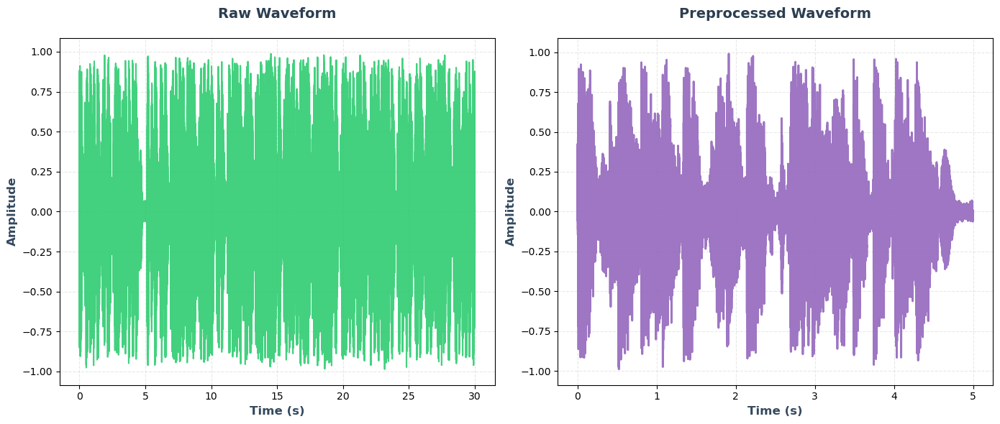

In [7]:
# Function to plot raw and preprocessed waveforms
def plot_waveforms(file_path):
    """
    Plots raw and preprocessed waveforms for the given audio file.
    Args:
        file_path (str): Path to the audio file.
    """
    print(f"Selected audio file: {file_path}")
    try:
        y_raw, sr = librosa.load(file_path, sr=22050, mono=True)        
        y_preprocessed, _ = preprocess_audio(file_path)# Preprocess the audio file using the provided function

        if y_raw is None or y_preprocessed is None:
            print("Unable to process the audio file.")
            return      
        time_raw = np.linspace(0, len(y_raw) / sr, len(y_raw))# Generate time axis
        time_preprocessed = np.linspace(0, len(y_preprocessed) / sr, len(y_preprocessed))

        # Plot raw waveform
        plt.figure(figsize=(14, 6))
        plt.subplot(1, 2, 1)
        plt.plot(time_raw, y_raw, color='#2ecc71', alpha=0.9, linewidth=1.5)  # Bright Accent
        plt.title('Raw Waveform', fontsize=14, fontweight='bold', color='#2C3E50', pad=20)
        plt.xlabel('Time (s)', fontsize=12, fontweight='bold', color='#34495E')
        plt.ylabel('Amplitude', fontsize=12, fontweight='bold', color='#34495E')
        plt.grid(True, linestyle='--', alpha=0.5, color='#D3D3D3')
        plt.gca().set_facecolor("#FFFFFF")  # White background

        # Plot preprocessed waveform
        plt.subplot(1, 2, 2)
        plt.plot(time_preprocessed, y_preprocessed, color='#9467bd', alpha=0.9, linewidth=2)  # Soft Purple
        plt.title('Preprocessed Waveform', fontsize=14, fontweight='bold', color='#2C3E50', pad=20)
        plt.xlabel('Time (s)', fontsize=12, fontweight='bold', color='#34495E')
        plt.ylabel('Amplitude', fontsize=12, fontweight='bold', color='#34495E')
        plt.grid(True, linestyle='--', alpha=0.5, color='#D3D3D3')
        plt.gca().set_facecolor("#FFFFFF")  # White background

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error visualizing file {file_path}: {e}")
        
selected_file = './genres_original/blues/blues.00084.wav'# Specify the desired file path directly
plot_waveforms(selected_file)# Visualize raw and preprocessed waveforms for the specific file

**Step 2.4: Audio Duration Analysis and Visualization**

In [8]:
def process_audio(dataset_df):
    durations, silence_ratios = [], []
    print("Processing audio files...")
    for file_path in dataset_df['file_path']:
        try:
            y, sr = librosa.load(file_path, sr=22050)
            durations.append(len(y) / sr)  # Calculate duration
            silence_ratios.append(np.sum(np.abs(y) < 1e-3) / len(y))  # Calculate silence ratio
        except Exception as e:
            durations.append(None)
            silence_ratios.append(None)
            print(f"Error processing {file_path}: {e}")
    dataset_df['duration'], dataset_df['silence_ratio'] = durations, silence_ratios
    return dataset_df

# Run processing and visualization
dataset_df = process_audio(dataset_df)  # Process audio

Processing audio files...


C:\Users\Harshitha Megharaj\AppData\Local\Temp\ipykernel_16652\828198919.py:6: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=22050)
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error processing ./genres_original\jazz\jazz.00054.wav: 


In [9]:
# Ensure `duration` and `silence_ratio` columns are in the dataset
if 'duration' not in dataset_df or 'silence_ratio' not in dataset_df:
    raise ValueError("Dataset must include 'duration' and 'silence_ratio' columns.")

# Calculate summary statistics
summary_stats = dataset_df[['duration', 'silence_ratio']].describe()

# Print summary statistics
print("Summary Statistics for Audio Properties:")
print(summary_stats)


Summary Statistics for Audio Properties:
         duration  silence_ratio
count  999.000000     999.000000
mean    30.024071       0.014570
std      0.080951       0.021148
min     29.931973       0.002036
25%     30.000181       0.005817
50%     30.013333       0.008575
75%     30.013333       0.014161
max     30.648889       0.307834


**Step 2.5: Visualize Random Audio File**

Visualizing audio file: ./genres_original\hiphop\hiphop.00058.wav

Playing the selected audio file:


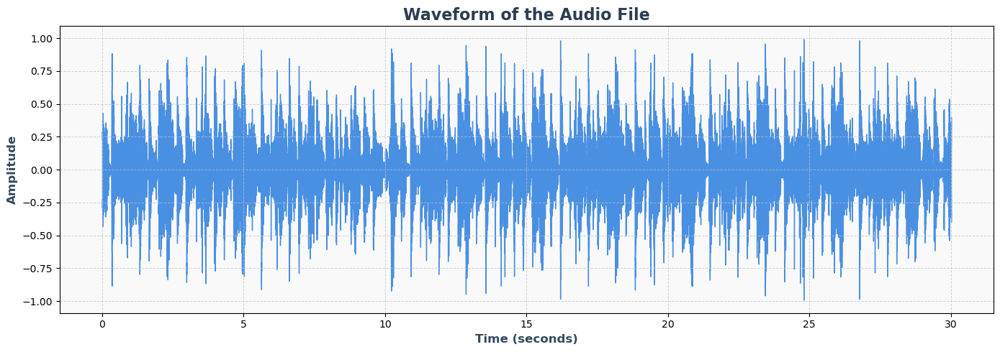

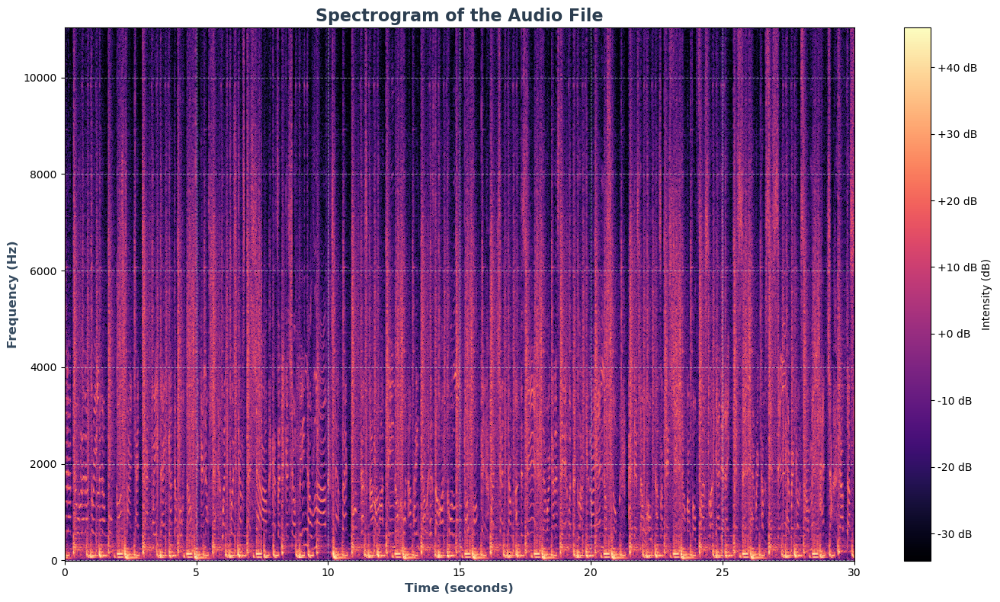

In [10]:
def visualize_audio(dataset_df, preprocess_audio):
    """
    Visualizes the waveform and spectrogram of a randomly selected audio file
    and provides an option to play the audio.

    Args:
        dataset_df (pd.DataFrame): DataFrame containing audio file paths.
        preprocess_audio (function): Function to preprocess and load the audio.

    Returns:
        None
    """
    # Select a random audio file
    random.seed(123)
    random_file = dataset_df['file_path'].sample(1).values[0]
    print(f"Visualizing audio file: {random_file}")

    # Preprocess and load the file
    try:
        y, sr = preprocess_audio(random_file)
    except Exception as e:
        print(f"Error loading file: {e}")
        return

    # Play the audio
    print("\nPlaying the selected audio file:")
    display(Audio(data=y, rate=sr))

    # Waveform Plot with Music-Themed Colors
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(y, sr=sr, color="#4A90E2")  # Soft blue color for the waveform
    plt.title("Waveform of the Audio File", fontsize=16, fontweight="bold", color="#2C3E50")
    plt.xlabel("Time (seconds)", fontsize=12, fontweight="bold", color="#34495E")
    plt.ylabel("Amplitude", fontsize=12, fontweight="bold", color="#34495E")
    plt.gca().set_facecolor("#f9f9f9")  # Light grey background
    plt.grid(color="#BDC3C7", linestyle="--", linewidth=0.7, alpha=0.7)  # Subtle gridlines
    plt.tight_layout()
    plt.show()

    # Compute and plot the spectrogram
    stft = librosa.stft(y)
    stft_db = librosa.amplitude_to_db(np.abs(stft))

    # Spectrogram Plot with Music-Themed Colors
    plt.figure(figsize=(14, 8))
    librosa.display.specshow(
        stft_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma'  # Purple-orange gradient
    )
    plt.colorbar(format='%+2.0f dB', label="Intensity (dB)", orientation='vertical')
    plt.title("Spectrogram of the Audio File", fontsize=16, fontweight="bold", color="#2C3E50")
    plt.xlabel("Time (seconds)", fontsize=12, fontweight="bold", color="#34495E")
    plt.ylabel("Frequency (Hz)", fontsize=12, fontweight="bold", color="#34495E")
    plt.gca().set_facecolor("#f9f9f9")  # Light grey background
    plt.grid(color="#BDC3C7", linestyle="--", linewidth=0.7, alpha=0.7)  # Subtle gridlines
    plt.tight_layout()
    plt.show()


# Example preprocess_audio function (to be implemented as needed)
def preprocess_audio(file_path):
    """
    Preprocesses and loads an audio file.

    Args:
        file_path (str): Path to the audio file.

    Returns:
        tuple: Audio time series and sampling rate.
    """
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")
    return librosa.load(file_path, sr=22050)

# Run visualization
visualize_audio(dataset_df, preprocess_audio)


## Feature Extraction

**Step 3.1: Extract Features from a Single Audio File**

In [11]:
def extract_features(file_path, target_sr=22050, duration=5):
    """
    Extracts audio features from a given audio file.
    Args:
        file_path (str): Path to the audio file.
        target_sr (int): Target sample rate.
        duration (int): Fixed duration in seconds.
    Returns:
        dict: Extracted features.
    """
    try:
        y, sr = librosa.load(file_path, sr=target_sr, mono=True)
        y = librosa.util.fix_length(y, size=target_sr * duration)

        # 1. Short-Time Fourier Transform (STFT)
        stft = np.abs(librosa.stft(y))
        stft_features = {
            'spectrogram_mean': np.mean(stft),
            'spectrogram_std': np.std(stft),
        }
            

        # 2. MFCC Features
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        mfcc_mean = np.mean(mfcc, axis=1)
        mfcc_features = {f'mfcc_{i}': mfcc_mean[i] for i in range(len(mfcc_mean))}

        # 3. Onset Strength
        onset_env = librosa.onset.onset_strength(y=y, sr=sr)
        onset_rate = np.sum(onset_env) / len(onset_env)
        onset_features = {'onset_rate': onset_rate}

        # 4. Spectral Contrast
        spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        spectral_contrast_mean = np.mean(spectral_contrast, axis=1)
        spectral_features = {f'spectral_contrast_{i}': spectral_contrast_mean[i] for i in range(len(spectral_contrast_mean))}

        # 5. Dynamic Range
        max_amplitude = np.max(y)
        min_amplitude = np.min(y)
        dynamic_range = {'dynamic_range': max_amplitude - min_amplitude}

        # 6. Chroma Features
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        chroma_mean = np.mean(chroma, axis=1)
        chroma_features = {f'chroma_{i}': chroma_mean[i] for i in range(len(chroma_mean))}

        # Combine all features
        features = {**stft_features, **mfcc_features, **onset_features, **spectral_features, **dynamic_range, **chroma_features}
        return features
    except Exception as e:
        print(f"Error extracting features from {file_path}: {e}")
        return None

**Batch Audio Feature Extraction and Dataframe Creation**

In [12]:
features_list = []
for _, row in dataset_df.iterrows():
    file_path = row['file_path']
    genre = row['genre']
    features = extract_features(file_path)
    if features:
        features['genre'] = genre
        features_list.append(features)

features_df = pd.DataFrame(features_list)

C:\Users\Harshitha Megharaj\AppData\Local\Temp\ipykernel_16652\443704227.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=target_sr, mono=True)
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error extracting features from ./genres_original\jazz\jazz.00054.wav: 


**Step 3.2: Dataset-Wide Feature Extraction and Export to CSV**

In [13]:
def extract_features_from_dataset(dataset_df, save_filename='music_features.csv'):
    """
    Extracts features for all audio files in the dataset and saves them to a CSV file.
    Args:
        dataset_df (pd.DataFrame): DataFrame containing file paths and genre labels.
        save_filename (str): Name of the CSV file to save the features.
    Returns:
        pd.DataFrame: DataFrame containing extracted features.
    """
    features_list = []

    for _, row in tqdm.tqdm(dataset_df.iterrows(), total=len(dataset_df)):
        file_path = row['file_path']
        genre = row['genre']
        features = extract_features(file_path)  # Use the extract_features function defined earlier
        if features:
            features['genre'] = genre  # Add the genre label
            features_list.append(features)    
    features_df = pd.DataFrame(features_list) # Convert to a DataFrame
    features_df.to_csv(save_filename, index=False)# Save to a CSV file
    print(f"Features saved to {save_filename}.")    
    return features_df

# Run Feature Extraction
features_df = extract_features_from_dataset(dataset_df, save_filename='music_features.csv')

print(f"Extracted features for {len(features_df)} audio files.")
features_df.head()

 55%|█████▌    | 554/1000 [00:43<00:30, 14.59it/s]C:\Users\Harshitha Megharaj\AppData\Local\Temp\ipykernel_16652\443704227.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=target_sr, mono=True)
 56%|█████▌    | 557/1000 [00:43<00:26, 16.78it/s]

Error extracting features from ./genres_original\jazz\jazz.00054.wav: 


100%|██████████| 1000/1000 [01:19<00:00, 12.56it/s]

Features saved to music_features.csv.
Extracted features for 999 audio files.


,spectrogram_mean,spectrogram_std,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,chroma_3,chroma_4,chroma_5,chroma_6,chroma_7,chroma_8,chroma_9,chroma_10,chroma_11,genre
0,1.114343,3.571434,-119.217590,124.338333,-22.838791,42.074741,-7.011255,19.987261,-16.026869,17.884809,...,0.242329,0.304670,0.337073,0.358894,0.381555,0.257219,0.313490,0.298342,0.334596,blues
1,0.645023,2.974842,-231.110641,117.292351,13.844360,40.625568,6.719326,23.114822,-7.070031,25.749584,...,0.231304,0.196516,0.251011,0.314344,0.423869,0.374833,0.280767,0.354661,0.505842,blues
2,1.372182,4.380424,-106.714699,138.272873,-25.117392,33.036263,-17.002466,25.984058,-14.420882,9.424596,...,0.476564,0.607307,0.347818,0.282917,0.293423,0.355147,0.372929,0.391830,0.528695,blues
3,0.677284,4.799248,-225.126144,160.490524,5.700141,26.851997,8.370368,9.451518,2.127471,10.046882,...,0.617993,0.754999,0.506491,0.282004,0.204902,0.194393,0.293167,0.301421,0.364010,blues
4,1.003512,3.147653,-148.099014,115.346161,-34.792789,25.507704,-34.924927,15.149554,-23.471218,1.445836,...,0.267644,0.142488,0.392756,0.198368,0.086363,0.323334,0.355515,0.437808,0.242740,blues


**Step 3.3: Validation of Extracted Features**

In [14]:
# Load the dataset
csv_file_path = "music_features.csv"  # Replace with the path to your CSV file
features_df = pd.read_csv(csv_file_path)

# Validation of Extracted Features
print("Validation of Extracted Features:")
print("-" * 50)

# Check for missing values
print("Missing Values per Feature:")
print(features_df.isnull().sum(), "\n")

# Check for invalid entries (e.g., infinities)
print("Invalid Values (Inf/-Inf) per Feature:")
print(features_df.isin([np.inf, -np.inf]).sum(), "\n")

# Range of each feature
print("Feature Ranges (Min, Max):")
print(features_df.describe().loc[['min', 'max']])


Validation of Extracted Features:
--------------------------------------------------
Missing Values per Feature:
spectrogram_mean       0
spectrogram_std        0
mfcc_0                 0
mfcc_1                 0
mfcc_2                 0
mfcc_3                 0
mfcc_4                 0
mfcc_5                 0
mfcc_6                 0
mfcc_7                 0
mfcc_8                 0
mfcc_9                 0
mfcc_10                0
mfcc_11                0
mfcc_12                0
onset_rate             0
spectral_contrast_0    0
spectral_contrast_1    0
spectral_contrast_2    0
spectral_contrast_3    0
spectral_contrast_4    0
spectral_contrast_5    0
spectral_contrast_6    0
dynamic_range          0
chroma_0               0
chroma_1               0
chroma_2               0
chroma_3               0
chroma_4               0
chroma_5               0
chroma_6               0
chroma_7               0
chroma_8               0
chroma_9               0
chroma_10              0
chroma_11   

**Statistical Summary**

In [15]:
# Basic statistics
print(features_df.describe())

       spectrogram_mean  spectrogram_std      mfcc_0      mfcc_1      mfcc_2  \
count        999.000000       999.000000  999.000000  999.000000  999.000000   
mean           1.173360         3.510769 -153.088256  100.491465   -8.994200   
std            0.754164         1.782907  105.471814   33.460839   23.802935   
min            0.018506         0.119242 -571.793640    1.566467  -94.477770   
25%            0.601841         2.276936 -209.743225   76.711280  -25.426915   
50%            1.054933         3.216773 -130.235820   98.253790  -10.885498   
75%            1.647514         4.681993  -78.851480  121.144495    6.588045   
max            4.266378        10.133397   34.501450  215.004910   72.283810   

           mfcc_3      mfcc_4      mfcc_5      mfcc_6      mfcc_7  ...  \
count  999.000000  999.000000  999.000000  999.000000  999.000000  ...   
mean    37.316639   -1.377632   15.260758   -5.750851   10.357501  ...   
std     17.677879   13.596454   12.567094   10.655889   1

**Step 3.5: Visualization of Feature Distributions**

C:\Users\Harshitha Megharaj\AN\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values

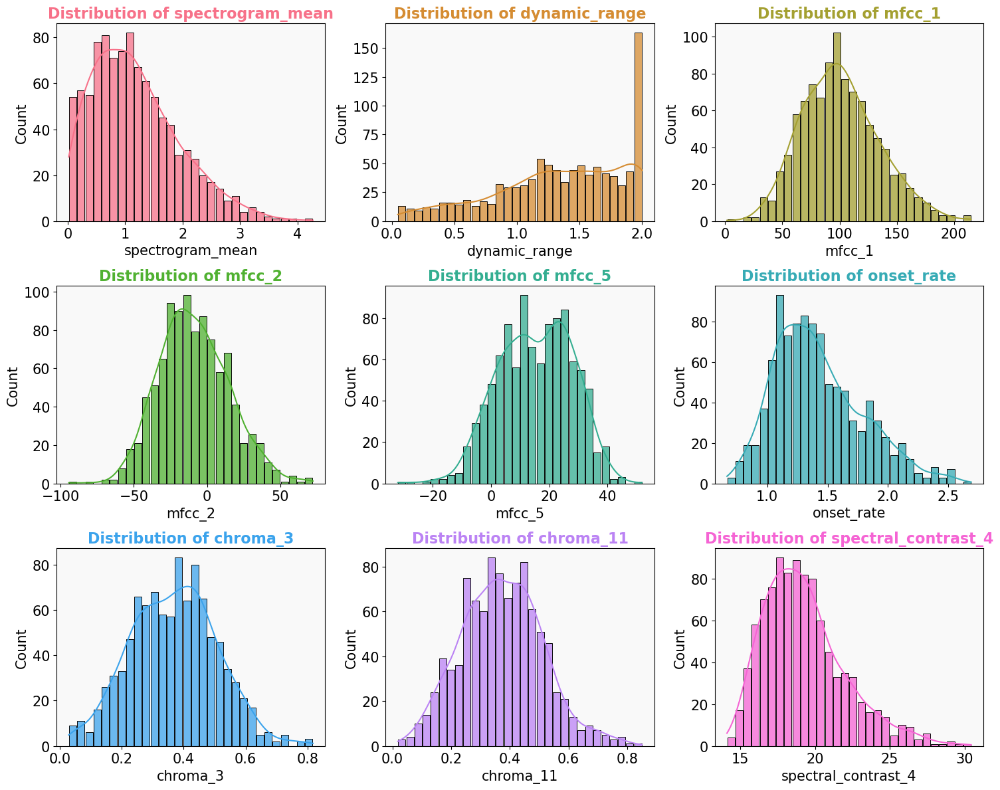

In [16]:
# Selecting a subset of features
selected_features = [
    "spectrogram_mean", "dynamic_range", 
    "mfcc_1", "mfcc_2", "mfcc_5", "onset_rate",
    "chroma_3", "chroma_11", "spectral_contrast_4"
]                 

num_features = len(selected_features)  # Number of selected features

cols = 3  # Number of plots per row
rows = math.ceil(num_features / cols)

# Define a palette of unique colors for each feature
color_palette = sns.color_palette("husl", num_features)  # Using 'husl' for varied and vibrant colors

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
axes = axes.flatten()  # Flatten the grid for easier indexing

for i, column in enumerate(selected_features):
    sns.histplot(features_df[column], kde=True, bins=30, 
                 color=color_palette[i], alpha=0.75, ax=axes[i], shrink=0.9, edgecolor="black")  # Add shrink for bar margins
    axes[i].set_title(f"Distribution of {column}", fontsize=16, color=color_palette[i], fontweight='bold')  # Bold title
    axes[i].set_xlabel(column, fontsize=15)  # Increased font size for x-axis label
    axes[i].set_ylabel("Count", fontsize=15)  # Increased font size for y-axis label
    axes[i].tick_params(axis='both', labelsize=15)  # Increased font size for axis values
    # Add a shaded background
    axes[i].set_facecolor('#f9f9f9')

for j in range(i + 1, len(axes)):  # Hide any unused subplots
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

**Step 3.6: Genre-Specific Feature Analysis**

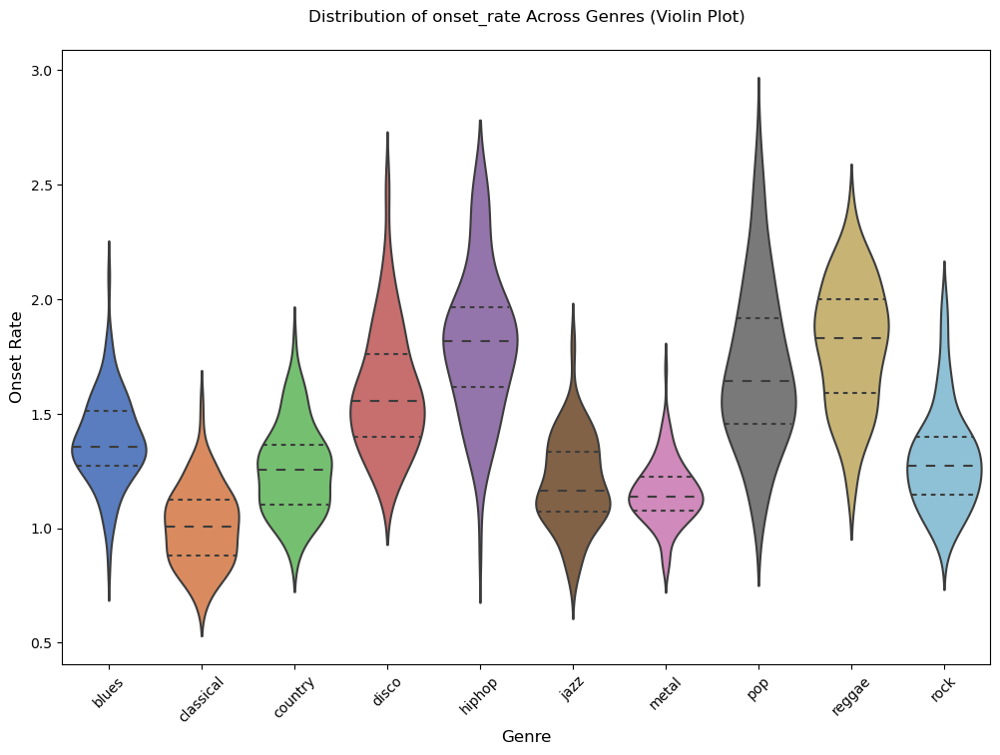

In [17]:
def genre_specific_feature_analysis(features_df, feature_column, genre_column):
    """
    Visualizes the distribution of a specific feature across genres using violin and box plots.
    
    Args:
        features_df (pd.DataFrame): DataFrame containing features and genre labels.
        feature_column (str): The feature to analyze.
        genre_column (str): The column containing genre labels.
    """
    plt.figure(figsize=(12, 8))
    sns.violinplot(
        x=genre_column, y=feature_column, 
        data=features_df, palette="muted", scale="width", inner="quartile"
    )
    plt.title(f"Distribution of {feature_column} Across Genres (Violin Plot)", fontsize=12, pad=20)
    plt.xlabel("Genre", fontsize=12, color='black')
    plt.ylabel("Onset Rate", fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

csv_file_path = "music_features.csv" # Load the dataset
features_df = pd.read_csv(csv_file_path)
feature_column = "onset_rate" 
genre_column = "genre"  # Replace with your genre column name

genre_specific_feature_analysis(features_df, feature_column, genre_column)# Perform analysis


**Step 3.7: Enhanced Feature Distributions Across Genres**

C:\Users\Harshitha Megharaj\AppData\Local\Temp\ipykernel_16652\2974719920.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 1400x1000 with 0 Axes>

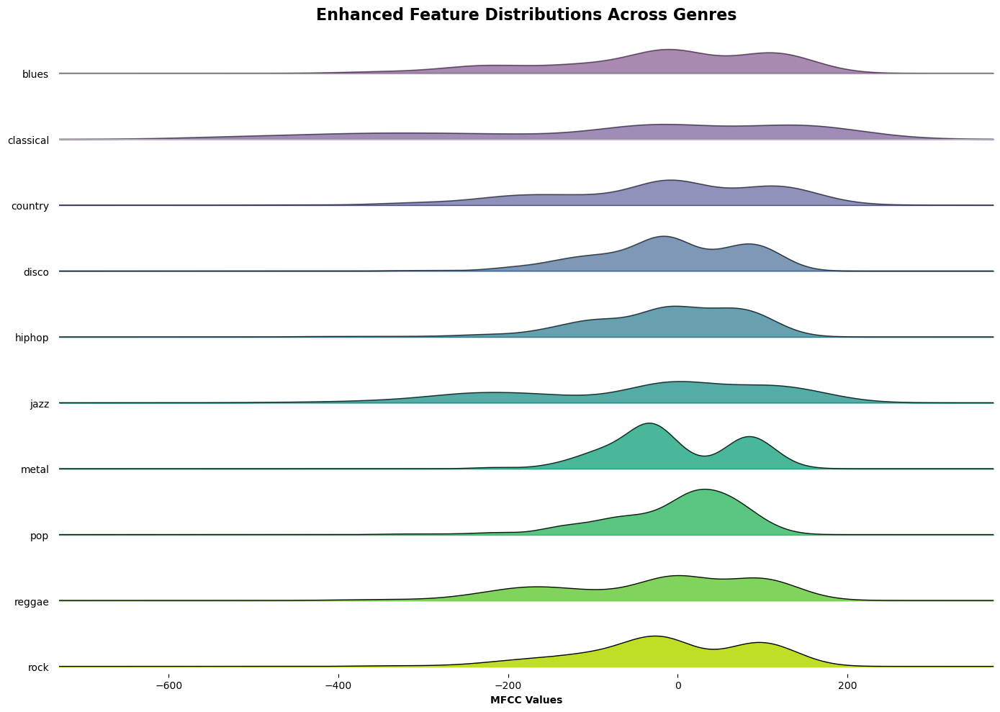

In [18]:
# List of features to include in the joyplot
required_features = [f'mfcc_{i}' for i in range(3)] + ['genre']  # Add more features as needed

# Check if all required features are present in the features_df
if all(feature in features_df.columns for feature in required_features):
    # Prepare data for joyplot
    melted_data = features_df[required_features].melt(id_vars=['genre'], var_name='Feature', value_name='Value')

    # Add labels and enhance visualization
    plt.figure(figsize=(14, 10))
    joyplot(
    data=melted_data,
    by='genre',
    column='Value',
    figsize=(14, 10),
    grid="y",
    fade=True,
    colormap=plt.cm.viridis,
    linewidth=1,
    overlap=1.2,
    alpha=0.9
)

    # Add title and styling
    plt.xlabel("MFCC Values", fontsize=10, fontweight="bold", color="black")
    plt.ylabel("Genres", fontsize=10, fontweight="bold", color="black")
    plt.gca().set_ylabel("Genres", fontsize=14, fontweight="bold", color="black")

    plt.title("Enhanced Feature Distributions Across Genres", fontsize=16, fontweight="bold", color="black")
    plt.tight_layout()
    plt.show()
else:
    # Print a warning if some features are missing
    missing_features = [feature for feature in required_features if feature not in features_df.columns]
    print(f"Missing features for joyplot visualization: {missing_features}")
    

**Step 3.8: Correlation Matrix**

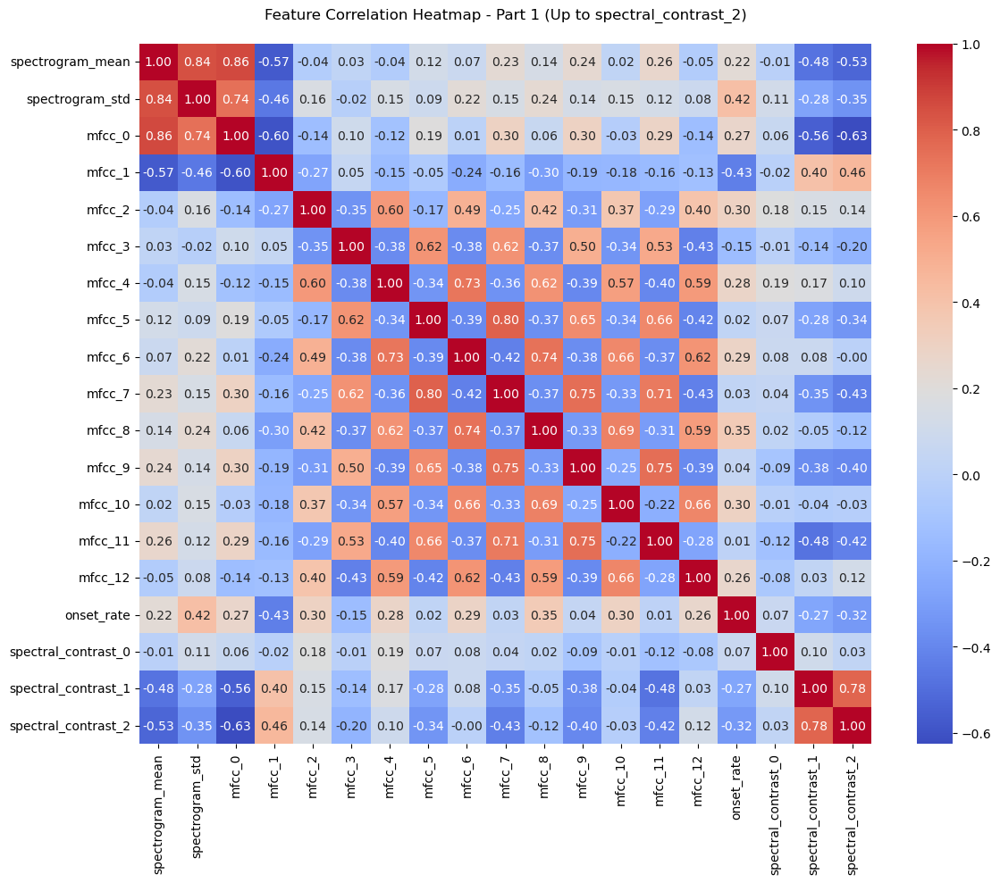

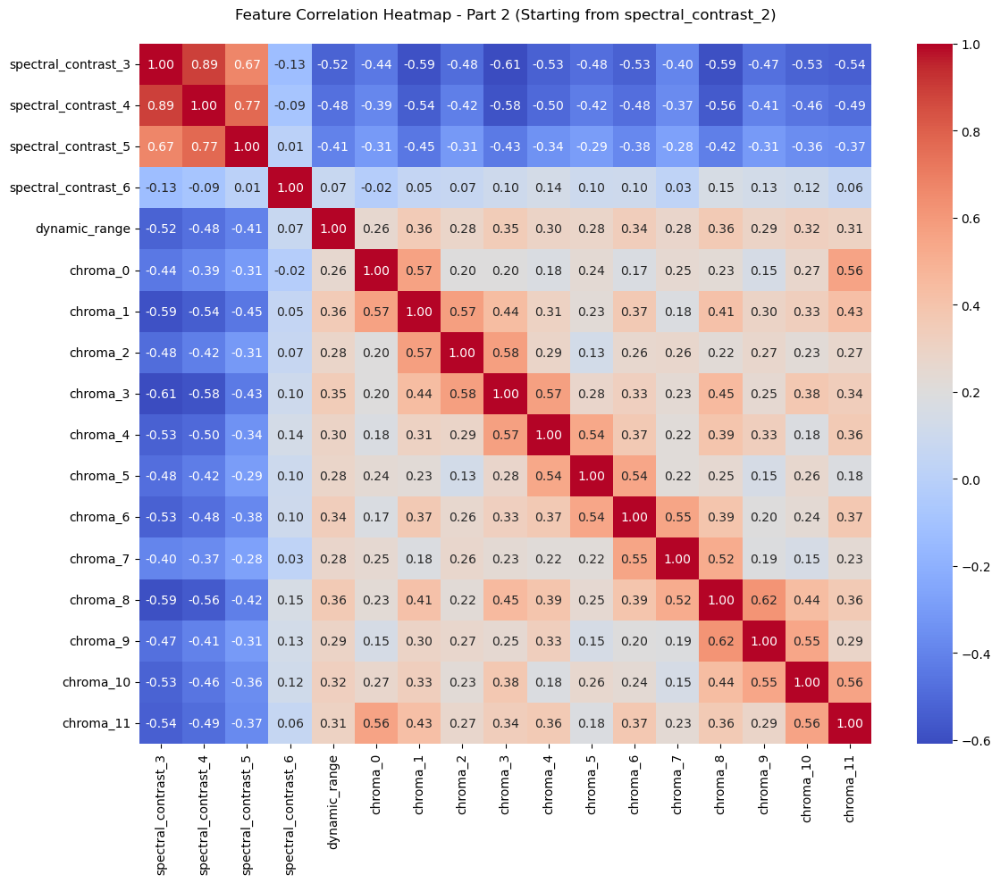

In [19]:
def split_correlation_heatmap_v2(corr_matrix, split_point):
    """
    Splits and plots the correlation heatmap into two parts.
    Args:
        corr_matrix (DataFrame): Correlation matrix of features.
        split_point (str): Column name to split the matrix at.
    """
    # Ensure split_point exists in the matrix
    if split_point not in corr_matrix.columns:
        raise ValueError(f"Split point '{split_point}' not found in the correlation matrix.")

    # Identify split index based on the feature name
    split_index = corr_matrix.columns.get_loc(split_point) + 1

    # Heatmap Part 1: Up to the split point
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix.iloc[:split_index, :split_index], 
                annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title(f'Feature Correlation Heatmap - Part 1 (Up to {split_point})', pad=20)
    plt.tight_layout()
    plt.show()

    # Heatmap Part 2: From the split point onward
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix.iloc[split_index:, split_index:], 
                annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title(f'Feature Correlation Heatmap - Part 2 (Starting from {split_point})', pad=20)
    plt.tight_layout()
    plt.show()


# Ensure 'features_df' contains numeric columns for correlation
numeric_columns = features_df.select_dtypes(include=['float64', 'int64']).columns

# Compute Correlation Matrix
correlation_matrix = features_df[numeric_columns].corr()

# Call the function to split and plot the heatmap
split_correlation_heatmap_v2(correlation_matrix, split_point='spectral_contrast_2')


## Genre Encoding and Label Encoder Persistence

**Step 4.1: Genre Label Encoding and Saving**

In [20]:
# Get all unique genres
all_genres = dataset_df['genre'].unique()

# Initialize and train the LabelEncoder on all genres
label_encoder = LabelEncoder()
label_encoder.fit(all_genres)

# Save the label encoder for future use
joblib.dump(label_encoder, 'label_encoder.pkl')
print("Label Encoder trained on all genres and saved to 'label_encoder.pkl'.")


Label Encoder trained on all genres and saved to 'label_encoder.pkl'.


**Step 4.2: Validate Genre Encoding**

In [21]:
# Encode genre labels in the dataset
features_df['genre_encoded'] = label_encoder.transform(features_df['genre'])

# Verify that all genres in the dataset are learned by the LabelEncoder
unique_genres = dataset_df['genre'].unique()  # All unique genres in the dataset
encoded_labels = label_encoder.transform(unique_genres)  # Encode all unique genres
decoded_labels = label_encoder.inverse_transform(encoded_labels)  # Decode back to verify

# Check if all unique genres are correctly encoded and decoded
verification_df = pd.DataFrame({
    'Original Genre': unique_genres,
    'Encoded Label': encoded_labels,
    'Decoded Genre': decoded_labels
})

print("Verification of LabelEncoder:")
print(verification_df)

# Assert to ensure no mismatch between original and decoded genres
assert all(verification_df['Original Genre'] == verification_df['Decoded Genre']), \
    "Error: Some genres are not properly learned by the LabelEncoder!"

print("All genres are properly learned and encoded by the LabelEncoder.")


Verification of LabelEncoder:
  Original Genre  Encoded Label Decoded Genre
0          blues              0         blues
1      classical              1     classical
2        country              2       country
3          disco              3         disco
4         hiphop              4        hiphop
5           jazz              5          jazz
6          metal              6         metal
7            pop              7           pop
8         reggae              8        reggae
9           rock              9          rock
All genres are properly learned and encoded by the LabelEncoder.


## Data Splitting

**Step 4.1: Partitioning the Dataset**

In [22]:
# Separate features (X) and target labels (y)
X = features_df.drop(columns=['genre', 'genre_encoded'])  # Features
y = features_df['genre_encoded']  # Encoded target labels

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [23]:
from collections import Counter# Print essential information
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")
print(f"Number of features: {X.shape[1]}")
print("\nClass Distribution in Training Set:")
print(dict(Counter(y_train)))
print("\nClass Distribution in Testing Set:")
print(dict(Counter(y_test)))

# Check for missing values in train and test sets
print("\nMissing Values in Training Set:", X_train.isnull().sum().sum())
print("Missing Values in Testing Set:", X_test.isnull().sum().sum())

Training set: 799 samples
Testing set: 200 samples
Number of features: 36

Class Distribution in Training Set:
{5: 79, 2: 80, 9: 80, 4: 80, 7: 80, 8: 80, 6: 80, 0: 80, 1: 80, 3: 80}

Class Distribution in Testing Set:
{1: 20, 0: 20, 6: 20, 5: 20, 2: 20, 9: 20, 4: 20, 8: 20, 3: 20, 7: 20}

Missing Values in Training Set: 0
Missing Values in Testing Set: 0


**Step 4.2: Standardizing the features**

In [24]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Save the scaler for future use
joblib.dump(scaler, 'scaler.pkl')
print("Scaler saved to 'scaler.pkl'.")


Scaler saved to 'scaler.pkl'.


In [25]:
# Save the feature column names for future predictions
trained_features = X.columns.tolist()
joblib.dump(trained_features, "trained_features.pkl")
print("Trained feature columns saved to 'trained_features.pkl'.")

Trained feature columns saved to 'trained_features.pkl'.


**Step 4.3: Verify Alignment of Feature Columns**

In [26]:
# Load the saved feature columns
trained_features = joblib.load("trained_features.pkl")

# Get the feature columns from the original training DataFrame
actual_features = X_train.columns.tolist()

# Verify alignment
if trained_features == actual_features:
    print("Features are perfectly aligned.")
else:
    print("Mismatch in features!")
    print("Features in trained_features.pkl:", trained_features)
    print("Features in X_train:", actual_features)


Features are perfectly aligned.


**Step 4.3: Training Multiple Models**

In [27]:
# Initialize models
models = {
    "SVM": SVC(kernel='rbf', probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Logistic Regression": LogisticRegression(random_state=42),
    "HistGradientBoosting": HistGradientBoostingClassifier(random_state=42),
    "MLPClassifier": MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
}

# Train and evaluate models
results = []
trained_models = {}

for model_name, model in models.items():
    print(f"Training {model_name}...")
    model.fit(X_train_scaled, y_train)
    trained_models[model_name] = model

    # Predictions
    y_train_pred = model.predict(X_train_scaled)
    y_test_pred = model.predict(X_test_scaled)
    y_test_proba = model.predict_proba(X_test_scaled) if hasattr(model, "predict_proba") else None

    # Evaluation
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0) if y_test_proba is not None else None

    # Store results
    results.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1,
    })

    print(f"{model_name} - Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

# Save the best model
results_df = pd.DataFrame(results)
best_model_name = results_df.loc[results_df['Test Accuracy'].idxmax(), 'Model']
best_model = trained_models[best_model_name]
joblib.dump(best_model, f"best_model_{best_model_name}.pkl")
print(f"Best model '{best_model_name}' saved as 'best_model_{best_model_name}.pkl'.")

#Table for Metrics
from tabulate import tabulate

metrics_table = results_df.set_index("Model")[["Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1-Score"]]
print("\nModel Performance Metrics Table:")
print(tabulate(metrics_table, headers="keys", tablefmt="fancy_grid", floatfmt=".4f"))


Training SVM...
SVM - Train Accuracy: 0.8436, Test Accuracy: 0.6750
Training Random Forest...
Random Forest - Train Accuracy: 0.9987, Test Accuracy: 0.6850
Training Logistic Regression...
Logistic Regression - Train Accuracy: 0.7860, Test Accuracy: 0.6150
Training HistGradientBoosting...
HistGradientBoosting - Train Accuracy: 0.9987, Test Accuracy: 0.6800
Training MLPClassifier...


C:\Users\Harshitha Megharaj\AN\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\Harshitha Megharaj\AN\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:43:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


MLPClassifier - Train Accuracy: 0.9987, Test Accuracy: 0.6600
Training XGBoost...
XGBoost - Train Accuracy: 0.9987, Test Accuracy: 0.6250
Training CatBoost...
CatBoost - Train Accuracy: 0.9987, Test Accuracy: 0.7250
Best model 'CatBoost' saved as 'best_model_CatBoost.pkl'.

Model Performance Metrics Table:
╒══════════════════════╤══════════════════╤═════════════════╤═════════════╤══════════╤════════════╕
│ Model                │   Train Accuracy │   Test Accuracy │   Precision │   Recall │   F1-Score │
╞══════════════════════╪══════════════════╪═════════════════╪═════════════╪══════════╪════════════╡
│ SVM                  │           0.8436 │          0.6750 │      0.6845 │   0.6750 │     0.6669 │
├──────────────────────┼──────────────────┼─────────────────┼─────────────┼──────────┼────────────┤
│ Random Forest        │           0.9987 │          0.6850 │      0.6859 │   0.6850 │     0.6779 │
├──────────────────────┼──────────────────┼─────────────────┼─────────────┼──────────┼──────

**Step 4.4: Hyperparameter Tuning**

In [28]:
# Hyperparameter grids for each model
param_grids = {
    "SVM": {
        "C": [0.1, 1, 10, 100],
        "gamma": [0.01, 0.1, 1],
        "kernel": ["rbf", "linear"]
    },
    "Random Forest": {
        "n_estimators": [50, 100, 200],
        "max_depth": [None, 10, 20],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "HistGradientBoosting": {
        "learning_rate": [0.01, 0.1, 0.2],
        "max_iter": [100, 200, 300],
        "max_depth": [None, 10, 20],
        "l2_regularization": [0.0, 0.1, 0.5]
    },
    "MLPClassifier": {
        "hidden_layer_sizes": [(50,), (100,), (100, 50)],
        "activation": ["relu", "tanh"],
        "solver": ["adam", "sgd"],
        "learning_rate_init": [0.001, 0.01, 0.1]
    },
    "XGBoost": {
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 6, 10],
        "n_estimators": [50, 100, 200]
    },
    "CatBoost": {
        "depth": [6, 8, 10],
        "learning_rate": [0.01, 0.05, 0.1],
        "iterations": [100, 150, 200],
        "early_stopping_rounds": [10]
    }
}

# Dictionary to store the best models
best_models = {}

# Perform GridSearchCV or RandomizedSearchCV for each model
for model_name, model in models.items():
    if model_name == "Logistic Regression":
        continue  # Skip Logistic Regression

    print(f"Tuning hyperparameters for {model_name}...")

    if model_name == "CatBoost":
        # Use RandomizedSearchCV for CatBoost to reduce computation time
        grid_search = RandomizedSearchCV(
            estimator=model,
            param_distributions=param_grids[model_name],
            scoring="accuracy",
            n_iter=10,  # Number of random combinations to try
            cv=3,  # 5-fold cross-validation
            verbose=2,
            n_jobs=-1
        )
    else:
        # Use GridSearchCV for other models
        grid_search = GridSearchCV(
            estimator=model,
            param_grid=param_grids[model_name],
            scoring="accuracy",
            cv=3,  # 5-fold cross-validation
            verbose=2,
            n_jobs=-1
        )

    # Fit GridSearchCV or RandomizedSearchCV
    grid_search.fit(X_train_scaled, y_train)

    # Save the best model and its parameters
    best_models[model_name] = {
        "best_estimator": grid_search.best_estimator_,
        "best_params": grid_search.best_params_,
        "best_score": grid_search.best_score_
    }

    print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    print(f"Best cross-validation score for {model_name}: {grid_search.best_score_:.4f}\n")

# Summary of best models
print("\nSummary of Best Models:")
for model_name, model_info in best_models.items():
    print(f"{model_name}: Best Params = {model_info['best_params']}, Best CV Score = {model_info['best_score']:.4f}")


Tuning hyperparameters for SVM...
Fitting 3 folds for each of 24 candidates, totalling 72 fits
Best parameters for SVM: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Best cross-validation score for SVM: 0.6495

Tuning hyperparameters for Random Forest...
Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best cross-validation score for Random Forest: 0.6345

Tuning hyperparameters for HistGradientBoosting...
Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best parameters for HistGradientBoosting: {'l2_regularization': 0.1, 'learning_rate': 0.1, 'max_depth': 10, 'max_iter': 200}
Best cross-validation score for HistGradientBoosting: 0.6358

Tuning hyperparameters for MLPClassifier...
Fitting 3 folds for each of 36 candidates, totalling 108 fits


C:\Users\Harshitha Megharaj\AN\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Best parameters for MLPClassifier: {'activation': 'tanh', 'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01, 'solver': 'sgd'}
Best cross-validation score for MLPClassifier: 0.6433

Tuning hyperparameters for XGBoost...
Fitting 3 folds for each of 27 candidates, totalling 81 fits


C:\Users\Harshitha Megharaj\AN\Lib\site-packages\xgboost\core.py:158: UserWarning: [21:50:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 50}
Best cross-validation score for XGBoost: 0.6094

Tuning hyperparameters for CatBoost...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for CatBoost: {'learning_rate': 0.1, 'iterations': 200, 'early_stopping_rounds': 10, 'depth': 6}
Best cross-validation score for CatBoost: 0.6332


Summary of Best Models:
SVM: Best Params = {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}, Best CV Score = 0.6495
Random Forest: Best Params = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}, Best CV Score = 0.6345
HistGradientBoosting: Best Params = {'l2_regularization': 0.1, 'learning_rate': 0.1, 'max_depth': 10, 'max_iter': 200}, Best CV Score = 0.6358
MLPClassifier: Best Params = {'activation': 'tanh', 'hidden_layer_sizes': (50,), 'learning_rate_init': 0.01, 'solver': 'sgd'}, Best CV Score = 0.6433
XGBoost: Best Params = {'learning_rate': 0.2, 'max_depth

In [29]:
# Evaluate training and test accuracy for best models
import pandas as pd
results_table = []

for model_name, model_info in best_models.items():
    best_model = model_info["best_estimator"]
    train_accuracy = best_model.score(X_train_scaled, y_train)
    test_accuracy = best_model.score(X_test_scaled, y_test)

    results_table.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy,
        "Test Accuracy": test_accuracy
    })

hypertuned_results_df = pd.DataFrame(results_table)
print("\nTraining and Test Accuracy Table:")
print(hypertuned_results_df.to_string(index=False))



Training and Test Accuracy Table:
               Model  Train Accuracy  Test Accuracy
                 SVM        0.933667          0.665
       Random Forest        0.998748          0.665
HistGradientBoosting        0.998748          0.650
       MLPClassifier        0.913642          0.625
             XGBoost        0.998748          0.610
            CatBoost        0.991239          0.680


In [30]:
# Save the best models
for model_name, model_info in best_models.items():
    best_model = model_info["best_estimator"]
    joblib.dump(best_model, f"tuned_best_model_{model_name}.pkl")
    print(f"Tuned best {model_name} model saved as 'tuned_best_model_{model_name}.pkl'.")

Tuned best SVM model saved as 'tuned_best_model_SVM.pkl'.
Tuned best Random Forest model saved as 'tuned_best_model_Random Forest.pkl'.
Tuned best HistGradientBoosting model saved as 'tuned_best_model_HistGradientBoosting.pkl'.
Tuned best MLPClassifier model saved as 'tuned_best_model_MLPClassifier.pkl'.
Tuned best XGBoost model saved as 'tuned_best_model_XGBoost.pkl'.
Tuned best CatBoost model saved as 'tuned_best_model_CatBoost.pkl'.


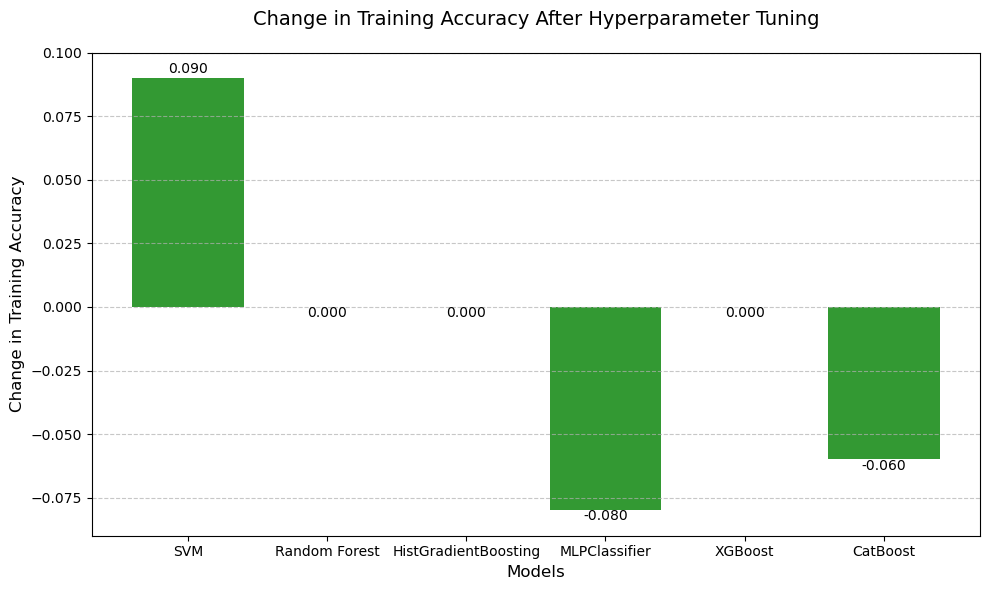

In [31]:
# Models
models = ["SVM", "Random Forest", "HistGradientBoosting", "MLPClassifier", "XGBoost", "CatBoost"]

# Training Accuracies Before and After Tuning
before_tuning = np.array([0.84, 0.99, 0.99, 0.99, 0.99, 0.99])
after_tuning = np.array([0.93, 0.99, 0.99, 0.91, 0.99, 0.93])

# Calculate the difference in accuracy
accuracy_difference = after_tuning - before_tuning

# Plot the differences
plt.figure(figsize=(10, 6))
plt.bar(models, accuracy_difference, color='green', alpha=0.8)

# Customize the chart
plt.title("Change in Training Accuracy After Hyperparameter Tuning", fontsize=14, pad=20)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Change in Training Accuracy", fontsize=12)
plt.ylim(min(accuracy_difference) - 0.01, max(accuracy_difference) + 0.01)  # Add margins for better visibility
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Annotate the bars with the values
for i, diff in enumerate(accuracy_difference):
    plt.text(i, diff + 0.002 if diff > 0 else diff - 0.004, f"{diff:.3f}", ha='center', fontsize=10, color='black')

# Show the chart
plt.show()


## Ensemble Method

**Step 5.1: Ensemble for SVM + CatBoost**

In [32]:
# Define the base models without Random Forest
voting_clf = VotingClassifier(estimators=[
    ('SVM', best_models['SVM']['best_estimator']),
    ('CatBoost', best_models['CatBoost']['best_estimator'])
], voting='soft')  # Use 'hard' for hard voting or 'soft' for probability-based voting

# Train the ensemble model
print("Training the voting classifier (SVM + CatBoost)...")
voting_clf.fit(X_train_scaled, y_train)

# Evaluate the ensemble model
y_train_pred = voting_clf.predict(X_train_scaled)
y_test_pred = voting_clf.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

# Print the results
print("\nVoting Classifier (SVM + CatBoost) Performance:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Save the ensemble model
joblib.dump(voting_clf, "voting_classifier_svm_catboost.pkl")
print("\nVoting Classifier (SVM + CatBoost) saved as 'voting_classifier_svm_catboost.pkl'.")


Training the voting classifier (SVM + CatBoost)...

Voting Classifier (SVM + CatBoost) Performance:
Training Accuracy: 0.9775
Testing Accuracy: 0.6850
Precision: 0.6888
Recall: 0.6850
F1 Score: 0.6788

Voting Classifier (SVM + CatBoost) saved as 'voting_classifier_svm_catboost.pkl'.


**Step 5.2: Ensemble for SVM + Random Forest**

In [33]:
# Load the best models from tuning
svm = joblib.load("tuned_best_model_SVM.pkl")
rfc = joblib.load("tuned_best_model_Random Forest.pkl")

# Create a VotingClassifier (Soft Voting)
ensemble_model = VotingClassifier(
    estimators=[
        ("SVM", svm),
        ("Random Forest", rfc)        
    ],
    voting='soft'  # Use soft voting to combine probabilities
)

# Train the ensemble model
print("Training the voting classifier (SVM + Random Forest)...")
ensemble_model.fit(X_train_scaled, y_train)

# Evaluate the ensemble model
y_train_pred = ensemble_model.predict(X_train_scaled)
y_test_pred = ensemble_model.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

# Print the results
print("\nEnsemble Model Performance:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Save the ensemble model
joblib.dump(ensemble_model, "ensemble_model.pkl")
print("\nVoting Classifier (SVM + Random Forest) saved as 'voting_classifier_svm_rf.pkl'.")


Training the voting classifier (SVM + Random Forest)...

Ensemble Model Performance:
Training Accuracy: 0.9975
Testing Accuracy: 0.7350
Precision: 0.7355
Recall: 0.7350
F1 Score: 0.7308

Voting Classifier (SVM + Random Forest) saved as 'voting_classifier_svm_rf.pkl'.


**Step 5.3: Ensemble for SVM + Random Forest + Catboost**

In [34]:
# Define the base models
voting_clf = VotingClassifier(estimators=[
    ('SVM', best_models['SVM']['best_estimator']),
    ('Random Forest', best_models['Random Forest']['best_estimator']),
    ('CatBoost', best_models['CatBoost']['best_estimator'])
], voting='soft')  # Use 'hard' for hard voting or 'soft' for probability-based voting

# Train the ensemble model
print("Training the voting classifier (SVM + Random Forest + CatBoost)...")
voting_clf.fit(X_train_scaled, y_train)

# Evaluate the ensemble model
y_train_pred = voting_clf.predict(X_train_scaled)
y_test_pred = voting_clf.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

# Print the results
print("\nVoting Classifier (SVM + Random Forest + CatBoost) Performance:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Save the ensemble model
joblib.dump(voting_clf, "voting_classifier_svm_rf_catboost.pkl")
print("\nVoting Classifier (SVM + Random Forest + CatBoost) saved as 'voting_classifier_svm_rf_catboost.pkl'.")


Training the voting classifier (SVM + Random Forest + CatBoost)...

Voting Classifier (SVM + Random Forest + CatBoost) Performance:
Training Accuracy: 0.9975
Testing Accuracy: 0.7250
Precision: 0.7271
Recall: 0.7250
F1 Score: 0.7194

Voting Classifier (SVM + Random Forest + CatBoost) saved as 'voting_classifier_svm_rf_catboost.pkl'.


**Step 5.4: Optimized Voting Classifier with Weight Tuning with cv=3**

In [35]:
# Define the base models
base_estimators = [
    ('SVM', best_models['SVM']['best_estimator']),
    ('Random Forest', best_models['Random Forest']['best_estimator'])
]

# Define the voting classifier with soft voting
voting_clf = VotingClassifier(estimators=base_estimators, voting='soft')

# Define possible weights for optimization
weights = [
    [1, 1],  # Equal weights
    [2, 1],  # Higher weight to SVM
    [1, 2],  # Higher weight to Random Forest
    [3, 1],  # Strong preference for SVM
    [1, 3]   # Strong preference for Random Forest
]

# Initialize GridSearchCV for weight optimization
grid_search_ensemble = GridSearchCV(
    estimator=voting_clf,
    param_grid={'weights': weights},
    cv=3,  # Cross-validation folds
    scoring='accuracy',
    verbose=2,
    n_jobs=-1
)

# Fit the optimized ensemble
print("Optimizing ensemble weights...")
grid_search_ensemble.fit(X_train_scaled, y_train)

# Get the best ensemble model
optimized_ensemble_model = grid_search_ensemble.best_estimator_
print("\nBest Ensemble Weights:", grid_search_ensemble.best_params_)
print(f"Best Cross-Validation Accuracy: {grid_search_ensemble.best_score_:.4f}")

# Evaluate the optimized ensemble model
print("\nEvaluating Optimized Ensemble Model...")

# Train Predictions
y_train_pred = optimized_ensemble_model.predict(X_train_scaled)
train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)

# Test Predictions
y_test_pred = optimized_ensemble_model.predict(X_test_scaled)
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

# Print evaluation metrics
print("\nOptimized Ensemble Model Metrics:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Training Precision: {train_precision:.4f}")
print(f"Training Recall: {train_recall:.4f}")
print(f"Training F1 Score: {train_f1:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Testing Precision: {test_precision:.4f}")
print(f"Testing Recall: {test_recall:.4f}")
print(f"Testing F1 Score: {test_f1:.4f}")

# Save the optimized ensemble model
joblib.dump(optimized_ensemble_model, "optimized_ensemble_model.pkl")
print("\nOptimized ensemble model saved as 'optimized_ensemble_model.pkl'.")


Optimizing ensemble weights...
Fitting 3 folds for each of 5 candidates, totalling 15 fits

Best Ensemble Weights: {'weights': [1, 2]}
Best Cross-Validation Accuracy: 0.6683

Evaluating Optimized Ensemble Model...

Optimized Ensemble Model Metrics:
Training Accuracy: 0.9987
Training Precision: 0.9988
Training Recall: 0.9987
Training F1 Score: 0.9987
Testing Accuracy: 0.7400
Testing Precision: 0.7392
Testing Recall: 0.7400
Testing F1 Score: 0.7339

Optimized ensemble model saved as 'optimized_ensemble_model.pkl'.


## Comparitive Analysis

**Step 6.1: Bar Plot Comparison for Optimized Ensemble, Tuned SVM, CatBoost**

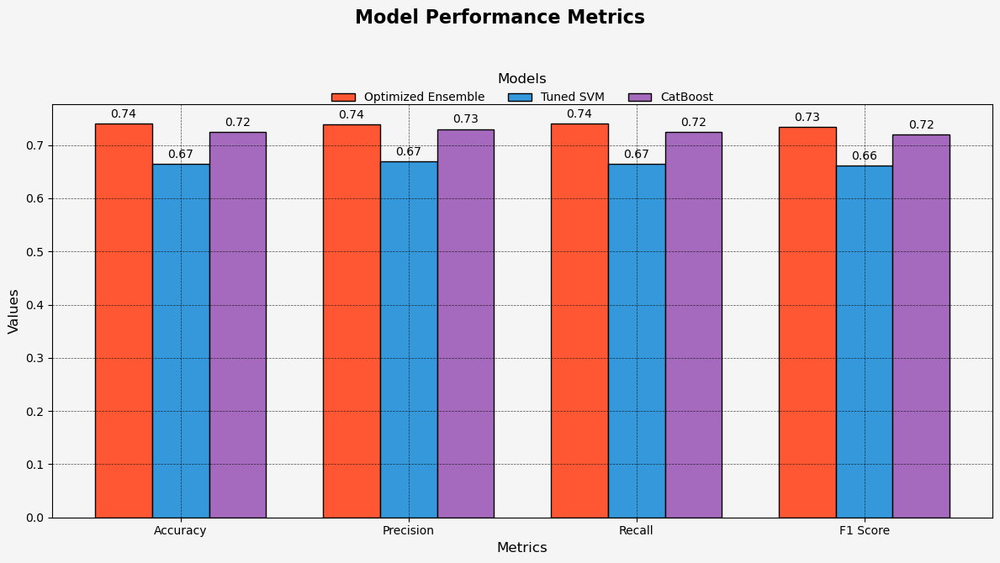

In [36]:
# Metrics
metrics = ["Accuracy", "Precision", "Recall", "F1 Score"]

# Values dynamically fetched from previous calculations
optimized_ensemble = [test_accuracy, test_precision, test_recall, test_f1]

tuned_svm_model = best_models['SVM']['best_estimator']
tuned_svm_y_pred = tuned_svm_model.predict(X_test_scaled)
tuned_svm_metrics = [
    accuracy_score(y_test, tuned_svm_y_pred),
    precision_score(y_test, tuned_svm_y_pred, average='weighted', zero_division=0),
    recall_score(y_test, tuned_svm_y_pred, average='weighted', zero_division=0),
    f1_score(y_test, tuned_svm_y_pred, average='weighted', zero_division=0),
]

catboost_results = results_df.loc[results_df['Model'] == 'CatBoost']
catboost = [
    catboost_results['Test Accuracy'].values[0],
    catboost_results['Precision'].values[0],
    catboost_results['Recall'].values[0],
    catboost_results['F1-Score'].values[0],
]

# Create the bar graph
x = np.arange(len(metrics))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_facecolor('#f5f5f5')  # Light gray background for better contrast
ax.set_facecolor('#f5f5f5')         # Light gray axis background

# Define the updated color palette
colors = ['#ff5733', '#3498db', '#a569bd']

# Create bars with updated colors
bars1 = ax.bar(x - width, optimized_ensemble, width, label="Optimized Ensemble", color=colors[0], edgecolor='black')
bars2 = ax.bar(x, tuned_svm_metrics, width, label="Tuned SVM", color=colors[1], edgecolor='black')
bars3 = ax.bar(x + width, catboost, width, label="CatBoost", color=colors[2], edgecolor='black')

# Annotate bar values
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

# Customize the graph
ax.set_xlabel("Metrics", fontsize=12, color='black')
ax.set_ylabel("Values", fontsize=12, color='black')
ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=10, color='black')
ax.tick_params(colors='black')  # Set tick colors to black
ax.legend(title="Models", fontsize=10, title_fontsize=12, loc="upper center", bbox_to_anchor=(0.5, 1.1), ncol=3, frameon=False)

# Add the title above the legend
fig.suptitle("Model Performance Metrics", fontsize=16, color='black', fontweight='bold', y=0.95)

# Add gridlines
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7, color='black', zorder=0)

plt.tight_layout(rect=[0, 0, 1, 0.93])  # Adjust layout to give space for the title
plt.show()


**Step 6.2: Confusion Matrices for Each Model**

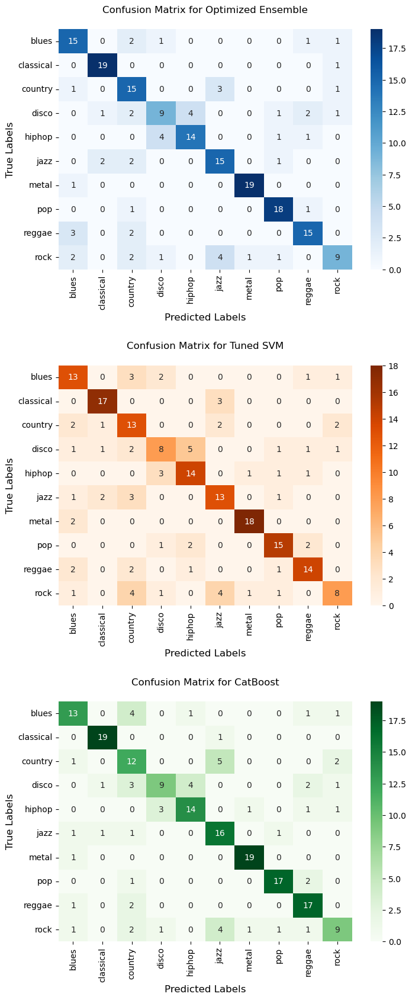

In [37]:
# Predictions for the three models
optimized_ensemble_pred = optimized_ensemble_model.predict(X_test_scaled)
tuned_svm_pred = best_models['SVM']['best_estimator'].predict(X_test_scaled)
catboost_pred = trained_models['CatBoost'].predict(X_test_scaled)

# Confusion matrices
cm_optimized_ensemble = confusion_matrix(y_test, optimized_ensemble_pred)
cm_tuned_svm = confusion_matrix(y_test, tuned_svm_pred)
cm_catboost = confusion_matrix(y_test, catboost_pred)

# Labels (Assuming these are the genre labels from your dataset)
genre_labels = label_encoder.inverse_transform(range(len(label_encoder.classes_)))

# Plot confusion matrices
fig, axes = plt.subplots(3, 1, figsize=(8, 20))

# Optimized Ensemble
sns.heatmap(cm_optimized_ensemble, annot=True, fmt='d', cmap='Blues', xticklabels=genre_labels, yticklabels=genre_labels, ax=axes[0])
axes[0].set_title("Confusion Matrix for Optimized Ensemble", fontsize=12, pad=20)
axes[0].set_xlabel("Predicted Labels", fontsize=12, color='black')
axes[0].set_ylabel("True Labels", fontsize=12)


# Tuned SVM
sns.heatmap(cm_tuned_svm, annot=True, fmt='d', cmap='Oranges', xticklabels=genre_labels, yticklabels=genre_labels, ax=axes[1])
axes[1].set_title("Confusion Matrix for Tuned SVM", fontsize=12, pad=20)
axes[1].set_xlabel("Predicted Labels", fontsize=12)
axes[1].set_ylabel("True Labels", fontsize=12)

# Non-Tuned CatBoost
sns.heatmap(cm_catboost, annot=True, fmt='d', cmap='Greens',xticklabels=genre_labels, yticklabels=genre_labels, ax=axes[2])
axes[2].set_title("Confusion Matrix for CatBoost", fontsize=12, pad=20)
axes[2].set_xlabel("Predicted Labels", fontsize=12)
axes[2].set_ylabel("True Labels", fontsize=12)

# Add space between plots
plt.subplots_adjust(hspace=0.4)
plt.show()


**Error Analysis and Misclassification Exploration**

Classification Report for Optimized Ensemble:

              precision    recall  f1-score   support

       blues       0.68      0.75      0.71        20
   classical       0.86      0.95      0.90        20
     country       0.58      0.75      0.65        20
       disco       0.60      0.45      0.51        20
      hiphop       0.78      0.70      0.74        20
        jazz       0.68      0.75      0.71        20
       metal       0.95      0.95      0.95        20
         pop       0.82      0.90      0.86        20
      reggae       0.75      0.75      0.75        20
        rock       0.69      0.45      0.55        20

    accuracy                           0.74       200
   macro avg       0.74      0.74      0.73       200
weighted avg       0.74      0.74      0.73       200


Detailed Misclassification Analysis:

Top Misclassification Pairs (True Label -> Predicted Label):

   True Label Predicted Label  Count
43     hiphop           disco      4
34      disco      

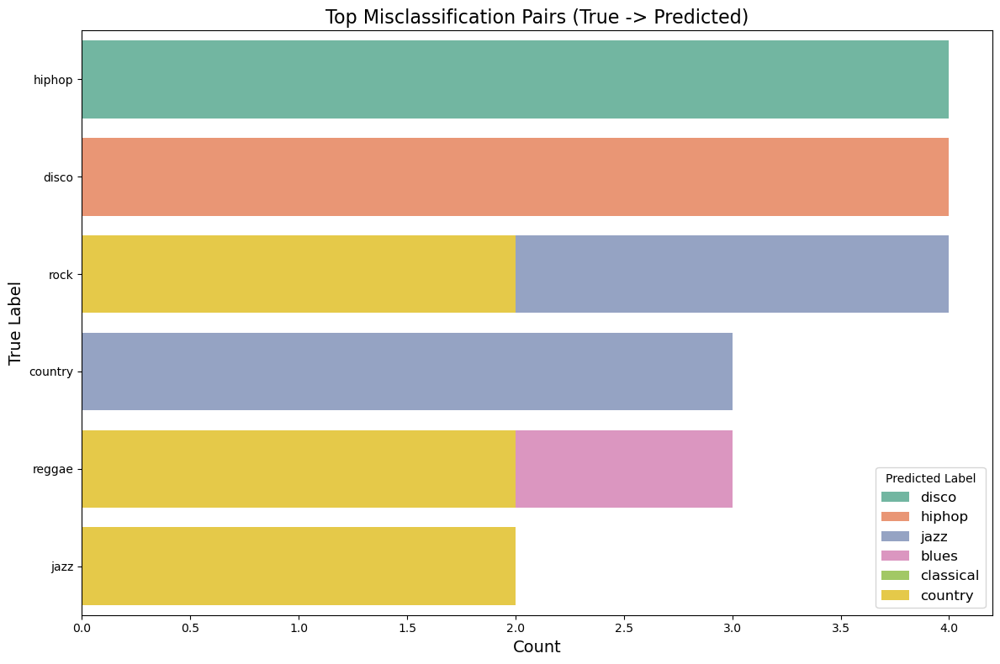

In [38]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Predictions for the Optimized Ensemble
optimized_ensemble_pred = optimized_ensemble_model.predict(X_test_scaled)

# Confusion matrix for the Optimized Ensemble
cm_optimized_ensemble = confusion_matrix(y_test, optimized_ensemble_pred)

# Labels (Assuming these are the genre labels from your dataset)
genre_labels = label_encoder.inverse_transform(range(len(label_encoder.classes_)))

# Classification report for the Optimized Ensemble
report_optimized_ensemble = classification_report(y_test, optimized_ensemble_pred, target_names=genre_labels)
print("Classification Report for Optimized Ensemble:\n")
print(report_optimized_ensemble)

# Deeper Analysis: Misclassification Pairs
print("\nDetailed Misclassification Analysis:\n")

# Convert confusion matrix into a DataFrame
cm_df = pd.DataFrame(cm_optimized_ensemble, index=genre_labels, columns=genre_labels)

# Identify misclassifications by subtracting diagonal elements
misclassification_matrix = cm_df.copy()
np.fill_diagonal(misclassification_matrix.values, 0)

# Flatten the matrix to find misclassification pairs and their counts
misclassified_pairs = (
    misclassification_matrix.stack()
    .reset_index()
    .rename(columns={'level_0': 'True Label', 'level_1': 'Predicted Label', 0: 'Count'})
    .sort_values(by='Count', ascending=False)
)

# Filter for significant misclassifications
significant_misclassifications = misclassified_pairs[misclassified_pairs['Count'] > 0]

# Print top misclassifications
print("Top Misclassification Pairs (True Label -> Predicted Label):\n")
print(significant_misclassifications.head(10))

# Visualization of misclassification pairs
plt.figure(figsize=(12, 8))
sns.barplot(
    data=significant_misclassifications.head(10),
    x='Count', y='True Label', hue='Predicted Label', dodge=False, palette='Set2'
)
plt.title("Top Misclassification Pairs (True -> Predicted)", fontsize=16)
plt.xlabel("Count", fontsize=14)
plt.ylabel("True Label", fontsize=14)
plt.legend(title="Predicted Label", fontsize=12)
plt.tight_layout()
plt.show()


**Step 6.3: Single ROC Curve Graph for All Models**

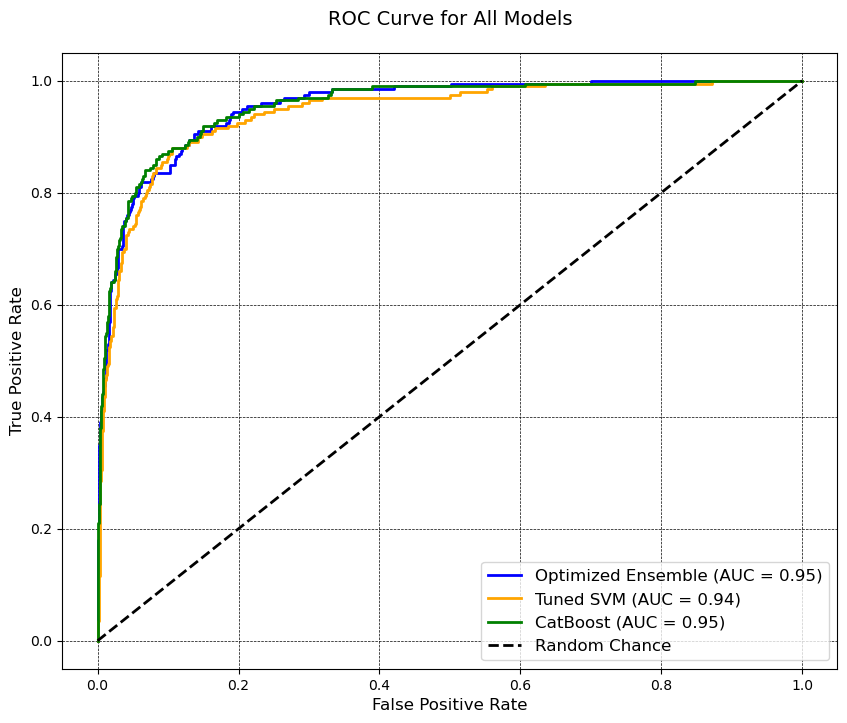

In [39]:
# Binarize the labels for ROC-AUC calculation
y_test_binarized = label_binarize(y_test, classes=range(len(label_encoder.classes_)))

# Predictions for probability scores
optimized_ensemble_proba = optimized_ensemble_model.predict_proba(X_test_scaled)
tuned_svm_proba = best_models['SVM']['best_estimator'].predict_proba(X_test_scaled)
non_tuned_catboost_proba = trained_models['CatBoost'].predict_proba(X_test_scaled)

# Colors for models
model_colors = ["blue", "orange", "green"]

# List of models and their probabilities
models = [
    ("Optimized Ensemble", optimized_ensemble_proba, model_colors[0]),
    ("Tuned SVM", tuned_svm_proba, model_colors[1]),
    ("CatBoost", non_tuned_catboost_proba, model_colors[2]),
]

# Initialize the plot
plt.figure(figsize=(10, 8))
plt.title("ROC Curve for All Models", fontsize=14, pad=20)

# Loop through each model to calculate and plot ROC-AUC
for model_name, proba, color in models:
    # Compute ROC curve and AUC for macro average
    fpr, tpr, _ = roc_curve(y_test_binarized.ravel(), proba.ravel())
    roc_auc = auc(fpr, tpr)
    
    # Plot the ROC curve
    plt.plot(fpr, tpr, color=color, lw=2, label=f"{model_name} (AUC = {roc_auc:.2f})")

# Add diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', lw=2, label="Random Chance")

# Finalize plot
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right", fontsize=12)
plt.grid(color="black", linestyle="--", linewidth=0.5)  # Black dashed gridlines
plt.gca().set_facecolor("white")  # Set background to white
plt.show()


**Step 6.4: Macro ROC-AUC for Each Model**

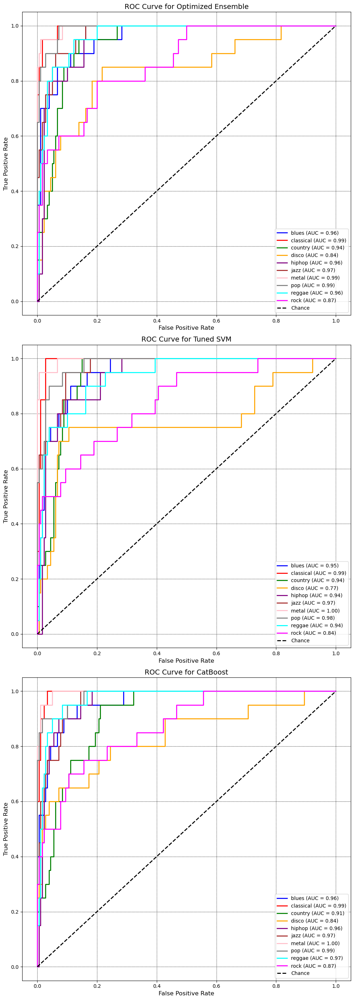

In [40]:
# Binarize the labels for ROC-AUC calculation
y_test_binarized = label_binarize(y_test, classes=range(len(label_encoder.classes_)))

# Predictions for probability scores
optimized_ensemble_proba = optimized_ensemble_model.predict_proba(X_test_scaled)
tuned_svm_proba = best_models['SVM']['best_estimator'].predict_proba(X_test_scaled)
non_tuned_catboost_proba = trained_models['CatBoost'].predict_proba(X_test_scaled)

# Colors for classes
colors = cycle(["blue", "red", "green", "orange", "purple", "brown", "pink", "gray", "cyan", "magenta"])

# Initialize subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 28))

# Set white background and black gridlines
plt.style.use('default')  # Ensures clean white background
for ax in axes:
    ax.set_facecolor("white")  # Set background color to white
    ax.grid(color="black", linestyle="--", linewidth=0.5)  # Black dashed grid lines

# List of models and their probabilities
models = [
    ("Optimized Ensemble", optimized_ensemble_proba, axes[0]),
    ("Tuned SVM", tuned_svm_proba, axes[1]),
    ("CatBoost", non_tuned_catboost_proba, axes[2]),
]

# Loop through each model to create the plot
for model_name, proba, ax in models:
    ax.set_title(f"ROC Curve for {model_name}", fontsize=14)
    ax.set_xlabel("False Positive Rate", fontsize=12)
    ax.set_ylabel("True Positive Rate", fontsize=12)
    
    # Plot ROC for each class
    for i, color in zip(range(len(genre_labels)), colors):
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], proba[:, i])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2, label=f"{genre_labels[i]} (AUC = {roc_auc:.2f})")
    
    # Add a diagonal reference line
    ax.plot([0, 1], [0, 1], 'k--', lw=2, label="Chance")
    ax.legend(loc="lower right", fontsize=10)

# Adjust spacing between plots
plt.tight_layout()
plt.show()


In [41]:
# Generate probabilities for each model
models = {
    "Optimized Ensemble": optimized_ensemble_model,
    "Tuned SVM": best_models['SVM']['best_estimator'],
    "Non-Tuned CatBoost": trained_models['CatBoost']
}

for model_name, model in models.items():
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test_scaled)
    else:
        # For models without `predict_proba`, use decision function
        y_proba = model.decision_function(X_test_scaled)
        y_proba = np.exp(y_proba) / np.sum(np.exp(y_proba), axis=1)
    
    macro_roc_auc = roc_auc_score(y_test, y_proba, multi_class="ovr", average="macro")
    print(f"Macro ROC-AUC for {model_name}: {macro_roc_auc:.4f}")


Macro ROC-AUC for Optimized Ensemble: 0.9470
Macro ROC-AUC for Tuned SVM: 0.9316
Macro ROC-AUC for Non-Tuned CatBoost: 0.9464


**Step 6.5: Feature Importance for Top performing models**

Calculating feature importance for Optimized Ensemble...


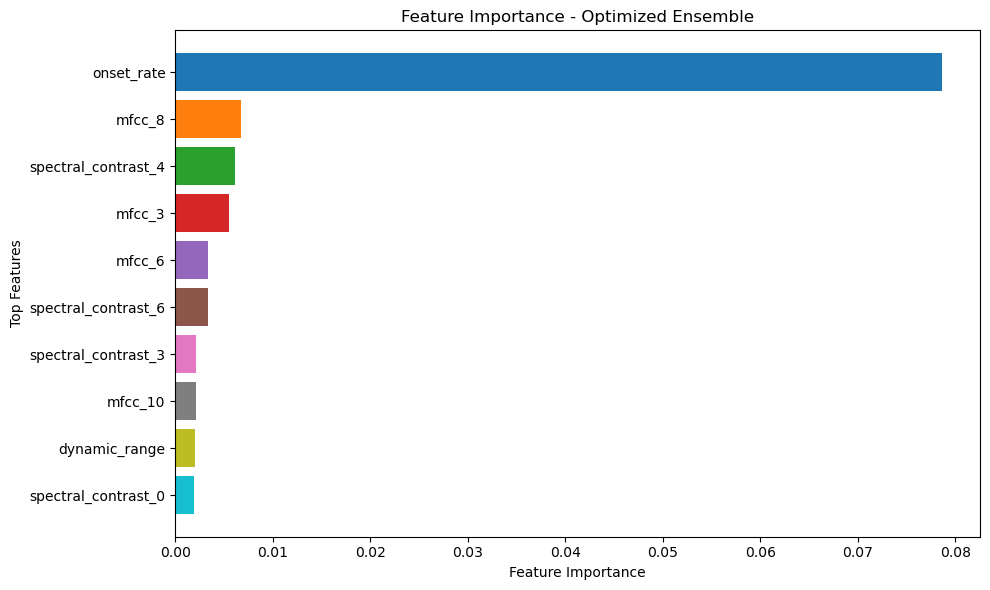

Calculating feature importance for CatBoost...


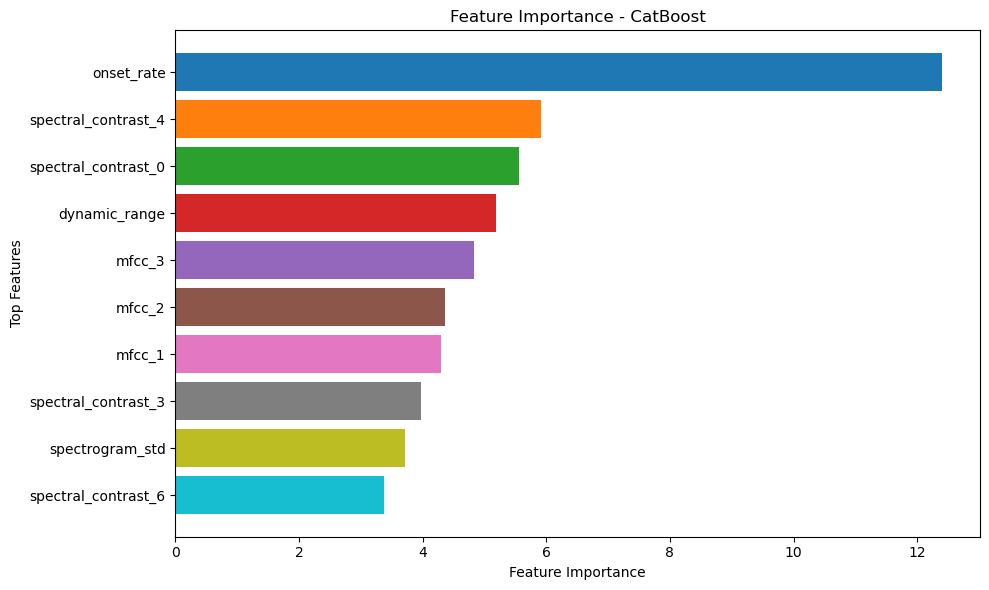

Calculating feature importance for Random Forest...


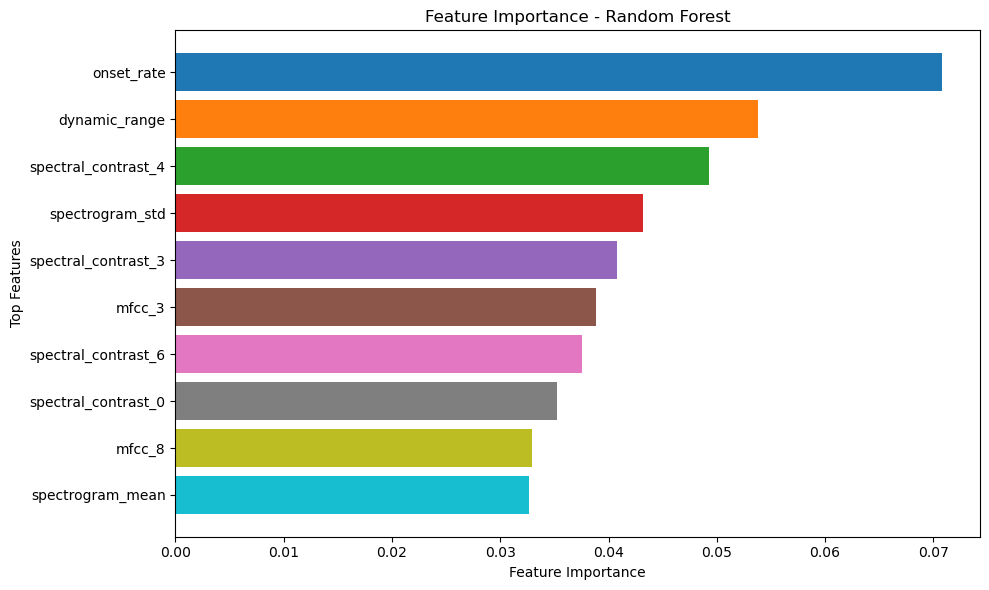

Calculating feature importance for SVM...


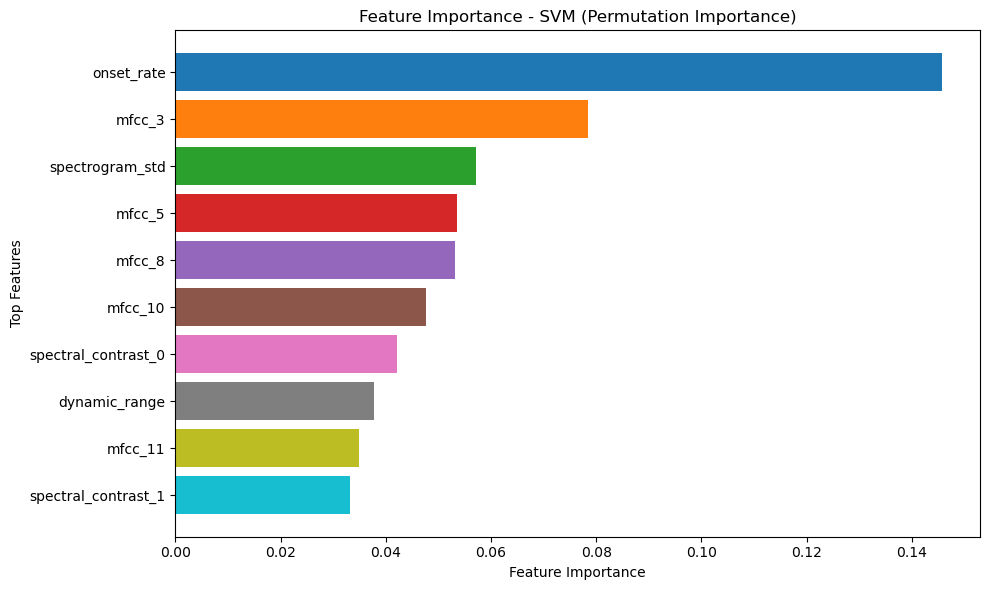

In [42]:
# Function to plot feature importance
def plot_feature_importance(importance, features, title):
    indices = np.argsort(importance)[::-1][:10]  # Get top 10 features
    top_importance = importance[indices]
    top_features = np.array(features)[indices]

    # Plot with unique colors
    plt.figure(figsize=(10, 6))
    bars = plt.barh(top_features, top_importance, color=plt.cm.tab10(np.linspace(0, 1, len(top_features))))
    plt.xlabel("Feature Importance")
    plt.ylabel("Top Features")
    plt.title(title)
    plt.gca().invert_yaxis()  # Invert to have the most important feature at the top
    plt.tight_layout()
    plt.show()

# Assuming X_train is a DataFrame with feature names
features = X_train.columns

# Optimized Ensemble Permutation Importance
print("Calculating feature importance for Optimized Ensemble...")
optimized_ensemble_model = joblib.load("optimized_ensemble_model.pkl")
ensemble_permutation = permutation_importance(optimized_ensemble_model, X_train_scaled, y_train, n_repeats=10, random_state=42)
plot_feature_importance(ensemble_permutation.importances_mean, features, "Feature Importance - Optimized Ensemble")

# CatBoost Feature Importance
print("Calculating feature importance for CatBoost...")
catboost_model = best_models["CatBoost"]["best_estimator"]
catboost_importance = catboost_model.get_feature_importance()
plot_feature_importance(catboost_importance, features, "Feature Importance - CatBoost")

# Random Forest Feature Importance
print("Calculating feature importance for Random Forest...")
rf_model = best_models["Random Forest"]["best_estimator"]
rf_importance = rf_model.feature_importances_
plot_feature_importance(rf_importance, features, "Feature Importance - Random Forest")

# SVM Permutation Importance
print("Calculating feature importance for SVM...")
svm_model = best_models["SVM"]["best_estimator"]
svm_permutation = permutation_importance(svm_model, X_train_scaled, y_train, n_repeats=10, random_state=42)
plot_feature_importance(svm_permutation.importances_mean, features, "Feature Importance - SVM (Permutation Importance)")


**Step 6.6: Permutation Test**

In [43]:
# Define the number of permutations
num_permutations = 1000

# Store permutation scores
perm_scores = []

# Calculate the actual score using your test set
actual_score = optimized_ensemble_model.score(X_test_scaled, y_test)

# Perform permutations
for _ in range(num_permutations):
    # Shuffle the target labels
    y_test_permuted = shuffle(y_test)
    
    # Calculate the model's score with permuted labels
    perm_score = optimized_ensemble_model.score(X_test_scaled, y_test_permuted)
    perm_scores.append(perm_score)

# Convert list to numpy array for analysis
perm_scores = np.array(perm_scores)

# Calculate the p-value
p_value = np.sum(perm_scores >= actual_score) / num_permutations

# Results
print(f"Actual Score: {actual_score:.4f}")
print(f"Permutation Test p-value: {p_value:.4f}")
if p_value < 0.05:
    print("The model's performance is significantly better than random (p < 0.05).")
else:
    print("No significant difference from random performance.")


Actual Score: 0.7400
Permutation Test p-value: 0.0000
The model's performance is significantly better than random (p < 0.05).


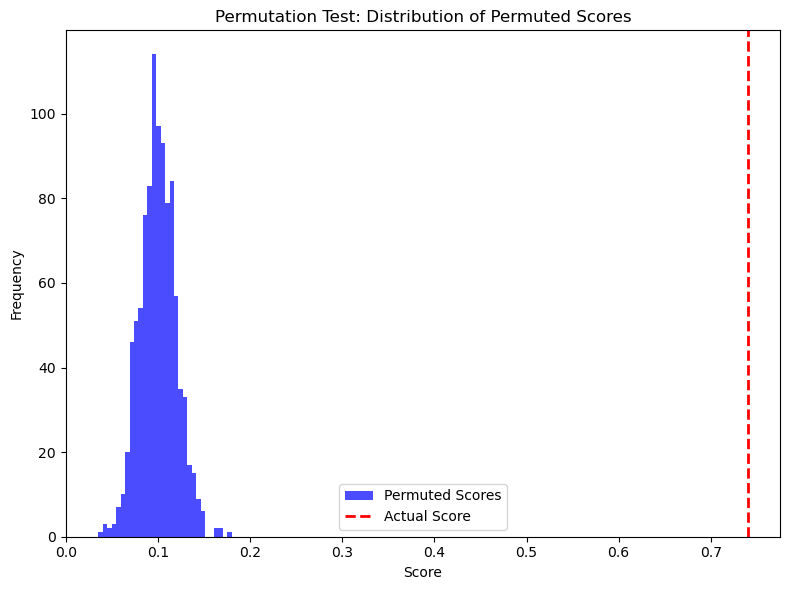

In [44]:
import matplotlib.pyplot as plt

# Plot the distribution of permuted scores
plt.figure(figsize=(8, 6))
plt.hist(perm_scores, bins=30, alpha=0.7, color='blue', label="Permuted Scores")
plt.axvline(actual_score, color='red', linestyle='--', linewidth=2, label="Actual Score")
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.title("Permutation Test: Distribution of Permuted Scores")
plt.legend()
plt.tight_layout()
plt.show()


Permutation Test Results
To validate the robustness of the model's performance, a permutation test was conducted. The test involves randomizing the target labels to break any meaningful relationships between the features and the labels. By comparing the model's actual performance against the performance on these permuted datasets, we assess whether the observed accuracy is significantly better than what could be achieved by chance.

Key Findings:
Actual Model Performance: The model achieved an accuracy of 0.74 on the original dataset, which serves as the benchmark for this analysis.

Significance of the Results: The actual model performance lies far beyond the range of the permuted scores, as indicated by the red dashed line in the graph. This observation is further supported by a p-value of 0.0000, indicating that none of the randomized trials achieved an accuracy as high as the model's actual score.

Conclusion: The results unequivocally demonstrate that the model's performance is significantly better than what could be attributed to random chance. This confirms the model's ability to extract meaningful patterns from the data and underscores its reliability for the given task.

Graphical Representation:
The graph below illustrates the results of the permutation test. The blue histogram represents the distribution of permuted scores, while the red dashed line marks the actual score. The clear separation between the actual performance and the randomized trials visually reinforces the statistical significance of the results.



## Prediction

Processing file: ./genres_original/metal/metal.00037.wav
Predicted Genre: metal
Probabilities for each genre:
blues: 0.1579
classical: 0.0018
country: 0.0142
disco: 0.0743
hiphop: 0.0481
jazz: 0.0043
metal: 0.4992
pop: 0.0045
reggae: 0.0478
rock: 0.1479


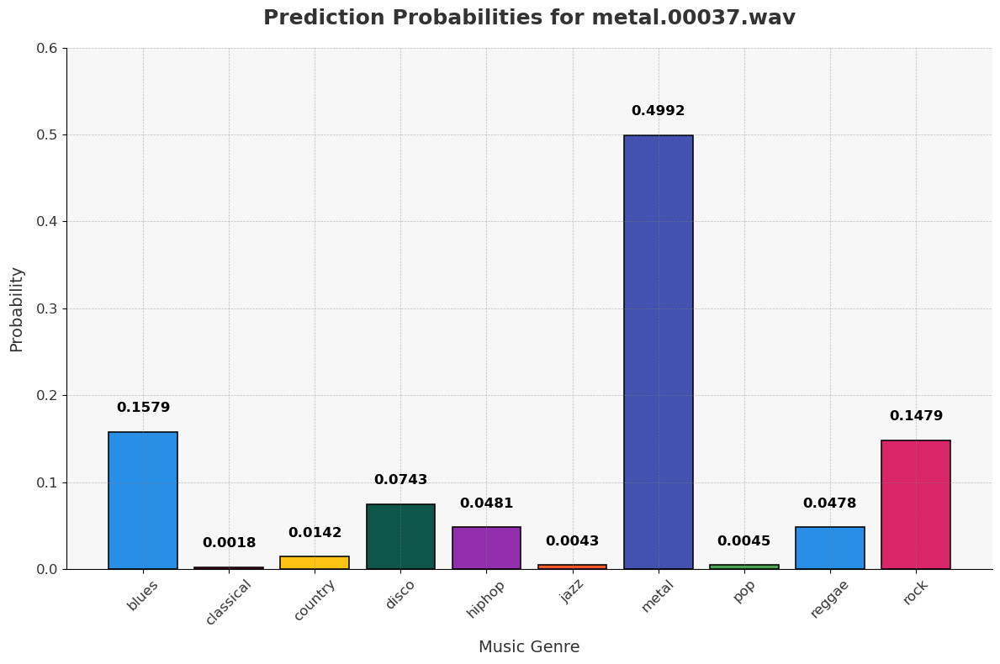


Final Predicted Genre: metal


In [45]:
# Function to preprocess the audio file
def preprocess_audio(file_path, target_sr=22050, duration=30):
    y, sr = librosa.load(file_path, sr=target_sr, mono=True)
    y = librosa.util.normalize(y)
    max_length = target_sr * duration
    if len(y) < max_length:
        y = librosa.util.fix_length(y, max_length)  # Ensure fixed length by padding
    else:
        y = y[:max_length]  # Trim if longer than expected
    return y, sr

# Function to extract features from a single audio file
def extract_features(file_path):
    try:
        y, sr = preprocess_audio(file_path)

        # Extract features
        features = {}
        # Spectrogram features
        stft = np.abs(librosa.stft(y))
        features['spectrogram_mean'] = np.mean(stft)
        features['spectrogram_std'] = np.std(stft)
        
        # MFCC features
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
        for i, mfcc_coeff in enumerate(np.mean(mfcc, axis=1)):
            features[f'mfcc_{i}'] = mfcc_coeff
        
        # Onset strength
        onset_env = librosa.onset.onset_strength(y=y, sr=sr)
        features['onset_rate'] = np.mean(onset_env)
        
        # Spectral contrast
        spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        for i, contrast in enumerate(np.mean(spectral_contrast, axis=1)):
            features[f'spectral_contrast_{i}'] = contrast
        
        # Dynamic range
        features['dynamic_range'] = np.max(y) - np.min(y)
        
        # Chroma features
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        for i, chroma_coeff in enumerate(np.mean(chroma, axis=1)):
            features[f'chroma_{i}'] = chroma_coeff
        
        return features  # Return as a dictionary
    except Exception as e:
        print(f"Error extracting features from {file_path}: {e}")
        return None

# Align features with trained model
def align_features(features, trained_features):
    feature_df = pd.DataFrame([features])  # Convert dictionary to DataFrame
    return feature_df.reindex(columns=trained_features, fill_value=0)

# Function to make predictions with the ensemble model
def predict_with_ensemble(file_path, model, scaler, label_encoder, trained_features):
    """
    Predicts the genre of a given audio file using the ensemble model and visualizes results.
    """
    print(f"Processing file: {file_path}")
    
    # Extract features
    features = extract_features(file_path)
    if features is None:
        print("Failed to extract features.")
        return None, None

    # Align features with the trained feature set
    feature_df = align_features(features, trained_features)
    
    # Scale the features
    scaled_features = scaler.transform(feature_df)
    
    # Make predictions
    probabilities = model.predict_proba(scaled_features)[0]
    predicted_label = model.predict(scaled_features)[0]
    predicted_genre = label_encoder.inverse_transform([predicted_label])[0]
    
    # Display results
    print(f"Predicted Genre: {predicted_genre}")
    print("Probabilities for each genre:")
    for genre, prob in zip(label_encoder.classes_, probabilities):
        print(f"{genre}: {prob:.4f}")

    # Enhanced Bar Chart Visualization
    plt.figure(figsize=(12, 8))
    genres = label_encoder.classes_

    # Define a unique color palette (distinct, vibrant colors)
    colors = ["#1E88E5", "#D81B60", "#FFC107", "#004D40", "#8E24AA", "#F4511E", "#3949AB", "#43A047"]
    colors = colors[:len(genres)]  # Ensure the palette matches the number of genres

    # Create bar chart with unique colors and design
    bars = plt.bar(genres, probabilities, color=colors, edgecolor='black', linewidth=1.2, alpha=0.95)

    # Add values on top of each bar
    for bar, prob in zip(bars, probabilities):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.02,
            f"{prob:.4f}",
            ha='center',
            va='bottom',
            fontsize=12,
            fontweight='bold',
            color='black'
        )

    # Add gradient-style background
    ax = plt.gca()
    ax.set_facecolor("#F7F7F7")  # Light gray background for better contrast
    ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5)  # Subtle gridlines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    # Title and axis labels
    plt.title(
        f"Prediction Probabilities for {file_path.split('/')[-1]}",
        fontsize=18,
        fontweight='bold',
        color="#333333",
        pad=20
    )
    plt.xlabel("Music Genre", fontsize=14, color="#333333", labelpad=10)
    plt.ylabel("Probability", fontsize=14, color="#333333", labelpad=10)

    # Customize x-axis and y-axis ticks
    plt.xticks(rotation=45, fontsize=12, color="#333333")
    plt.yticks(fontsize=12, color="#333333")

    # Set y-axis limit to 0.6
    plt.ylim(0, 0.6)

    plt.tight_layout()
    plt.show()

    # Return predicted genre and audio player
    return predicted_genre, Audio(file_path)

# Test the final ensemble model on an audio file
test_audio_file = "./genres_original/metal/metal.00037.wav"  # Replace with your audio file path
predicted_genre, audio_player = predict_with_ensemble(
    test_audio_file,
    optimized_ensemble_model,
    scaler,
    label_encoder,
    trained_features,
)

# Display the predicted genre and play the audio
print(f"\nFinal Predicted Genre: {predicted_genre}")
audio_player


Processing file: ./genres_original/classical/classical.00045.wav
Predicted Genre: classical
Probabilities for each genre:
blues: 0.0726
classical: 0.4652
country: 0.1160
disco: 0.0184
hiphop: 0.0058
jazz: 0.2238
metal: 0.0039
pop: 0.0585
reggae: 0.0088
rock: 0.0271


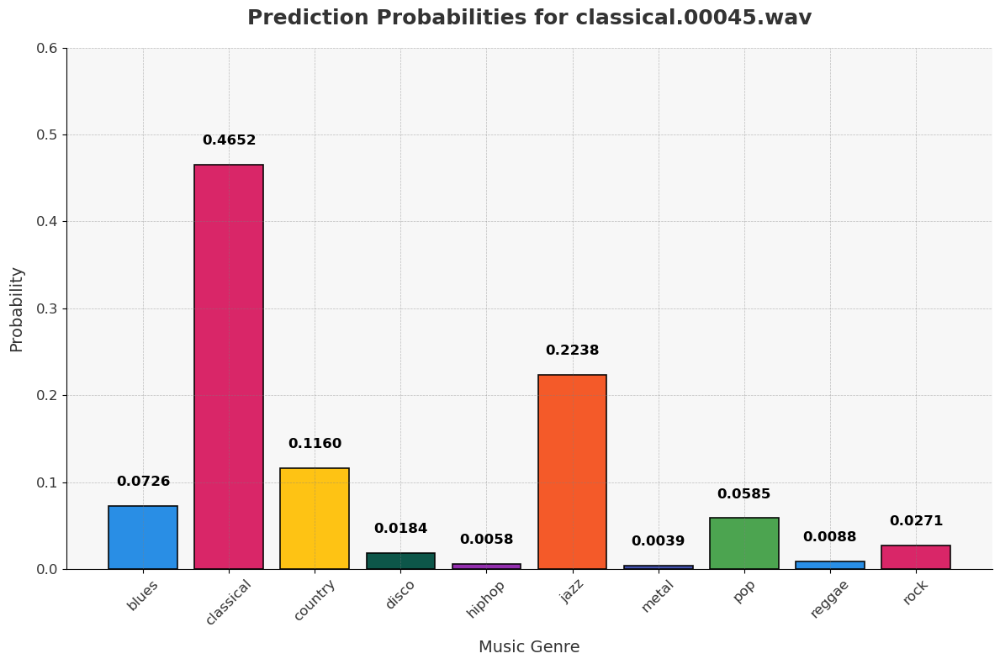


Final Predicted Genre: classical


In [46]:
# Test the final ensemble model on an audio file
test_audio_file = "./genres_original/classical/classical.00045.wav"  # Replace with your audio file path
predicted_genre, audio_player = predict_with_ensemble(
    test_audio_file,
    optimized_ensemble_model,
    scaler,
    label_encoder,
    trained_features
)

# Play the audio
print(f"\nFinal Predicted Genre: {predicted_genre}")
audio_player

## Checking Model Performance using Feature Selection

In [47]:
from sklearn.inspection import permutation_importance
import numpy as np

# Calculate permutation importance for the optimized ensemble
perm_importance = permutation_importance(optimized_ensemble_model, X_train_scaled, y_train, n_repeats=10, random_state=42)

# Get the top 20 features based on importance
top_feature_indices = np.argsort(perm_importance.importances_mean)[::-1][:20]
selected_features = X_train.columns[top_feature_indices]

print(f"Top Features Selected: {selected_features.tolist()}")


Top Features Selected: ['onset_rate', 'mfcc_8', 'spectral_contrast_4', 'mfcc_3', 'mfcc_6', 'spectral_contrast_6', 'spectral_contrast_3', 'mfcc_10', 'dynamic_range', 'spectral_contrast_0', 'spectrogram_std', 'spectral_contrast_2', 'mfcc_12', 'spectral_contrast_1', 'mfcc_1', 'mfcc_0', 'mfcc_5', 'chroma_5', 'mfcc_2', 'mfcc_11']


In [48]:
# Filter training and testing data to include only selected features
X_train_selected = X_train_scaled[:, top_feature_indices]
X_test_selected = X_test_scaled[:, top_feature_indices]

# Retrain the ensemble
optimized_ensemble_model.fit(X_train_selected, y_train)

# Evaluate performance
y_test_pred = optimized_ensemble_model.predict(X_test_selected)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy with Feature Selection: {test_accuracy:.4f}")


Test Accuracy with Feature Selection: 0.7100
